In [1]:
import sys           
import numpy as np    
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.dates import date2num, num2date
from matplotlib import dates as mdates
from matplotlib import ticker
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors
from scipy.stats import poisson
from scipy import stats as sps
from scipy.interpolate import interp1d
from IPython.display import clear_output
from scipy.stats import pearsonr
import scipy.stats as stats


# # importing the sys module
# sys.setrecursionlimit(10**6)

In [6]:
df_mobility_world = pd.read_csv("Global_Mobility_Report.csv",sep=',', on_bad_lines = 'skip')
desired_country = 'Italy'  

rmv_country_data = (df_mobility_world['country_region'] == desired_country)
df_mobility_ita = df_mobility_world[rmv_country_data]
df_mobility_ita=df_mobility_ita.drop(['country_region_code', 'country_region','place_id', 'sub_region_2','metro_area','iso_3166_2_code',
        'census_fips_code'], axis=1)

reg_dict = {"Friuli-Venezia Giulia":"Friuli Venezia Giulia",
                'Lombardy':'Lombardia','Trentino-South Tyrol':'P.A. Trento',
               'Piedmont':'Piemonte','Aosta':"Valle d'Aosta",'Sicily': 'Sicilia','Apulia':'Puglia','Tuscany':'Toscana',
               'Sardinia':'Sardegna'}

df_mobility_ita.drop( df_mobility_ita[ df_mobility_ita['sub_region_1'] =='Trentino-South Tyrol' ].index , inplace=True)
df_mobility_ita['retail_and_recreation_percent_change_from_baseline'] = df_mobility_ita['retail_and_recreation_percent_change_from_baseline'].rolling(7).mean()
df_mobility_ita['parks_percent_change_from_baseline'] = df_mobility_ita['parks_percent_change_from_baseline'].rolling(7).mean()
df_mobility_ita['transit_stations_percent_change_from_baseline'] = df_mobility_ita['transit_stations_percent_change_from_baseline'].rolling(7).mean()
df_mobility_ita['workplaces_percent_change_from_baseline'] = df_mobility_ita['workplaces_percent_change_from_baseline'].rolling(7).mean()
df_mobility_ita['residential_percent_change_from_baseline'] = df_mobility_ita['residential_percent_change_from_baseline'].rolling(7).mean()
df_mobility_ita['grocery_and_pharmacy_percent_change_from_baseline'] = df_mobility_ita['grocery_and_pharmacy_percent_change_from_baseline'].rolling(7).mean() 

for i in range(len(reg_dict.keys())):
    df_mobility_ita["sub_region_1"].replace(reg_dict, inplace=True)
    
mobility_columns = {'retail_and_recreation_percent_change_from_baseline':'retail_and_recreation',
                    'parks_percent_change_from_baseline':'parks', 
                    'transit_stations_percent_change_from_baseline':'transit_stations', 
                    'workplaces_percent_change_from_baseline':'workplaces', 
                    'residential_percent_change_from_baseline':'residential', 
                    'grocery_and_pharmacy_percent_change_from_baseline':'grocery_and_pharmacy', 
                    'residential_percent_change_from_baseline':'residential'}
df_mobility_ita.rename(columns=mobility_columns, inplace=True)
df_mobility_ita.dropna(inplace = True)

C:\Users\Shayan\AppData\Local\Temp\ipykernel_33620\3492553021.py:1: DtypeWarning: Columns (3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df_mobility_world = pd.read_csv("Global_Mobility_Report.csv",sep=',', on_bad_lines = 'skip')


In [7]:
df_mobility_ita

,sub_region_1,date,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
5679923,Abruzzo,2020-02-15,-2.857143,17.142857,43.714286,-2.000000,-8.285714,1.571429
5679924,Abruzzo,2020-02-16,-1.714286,15.428571,45.142857,2.571429,-6.857143,0.857143
5679925,Abruzzo,2020-02-17,-1.571429,12.571429,39.428571,4.142857,-5.285714,0.428571
5679926,Abruzzo,2020-02-18,-1.000000,9.857143,35.714286,5.571429,-3.714286,0.000000
5679927,Abruzzo,2020-02-19,-0.857143,7.000000,29.285714,6.571429,-2.142857,-0.428571
...,...,...,...,...,...,...,...,...
5802639,Veneto,2022-10-11,-7.714286,12.142857,78.428571,18.142857,-7.428571,1.571429
5802640,Veneto,2022-10-12,-7.571429,12.142857,79.142857,18.142857,-7.285714,1.571429
5802641,Veneto,2022-10-13,-7.571429,12.285714,78.857143,18.285714,-7.285714,1.571429
5802642,Veneto,2022-10-14,-7.285714,12.714286,77.142857,19.000000,-7.285714,1.571429


In [13]:
import pandas as pd

# Load your mobility dataset
# Assuming your mobility dataset is named 'df_mobility_world'
# Replace 'Global_Mobility_Report.csv' with the actual file path if needed
df_mobility_world = df_mobility_ita

# Load your COVID-19 dataset
# Assuming your COVID-19 dataset is named 'covid_df'
# Replace 'province.csv' with the actual file path if needed
covid_df = pd.read_csv('province.csv', low_memory=False)

# Extract relevant columns for correlation analysis
mobility_columns = ['sub_region_1', 'date', 'retail_and_recreation', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential']
covid_columns = ['denominazione_regione', 'data', 'totale_casi']

# Select only the relevant columns
df_mobility_world = df_mobility_world[mobility_columns]
covid_df = covid_df[covid_columns]

# Convert 'data' column to datetime format
covid_df['data'] = pd.to_datetime(covid_df['data'])
df_mobility_world['date'] = pd.to_datetime(df_mobility_world['date'])

# Merge the datasets based on the date and region columns
merged_df = pd.merge(covid_df, df_mobility_world, left_on=['denominazione_regione', 'data'], right_on=['sub_region_1', 'date'], how='inner')

# Calculate daily changes in mobility categories
mobility_categories = ['retail_and_recreation', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential']

for category in mobility_categories:
    merged_df[f'{category}_change'] = merged_df[category].diff()

# Calculate correlation coefficients
correlation_matrix = merged_df[['retail_and_recreation_change', 'grocery_and_pharmacy_change', 'parks_change', 'transit_stations_change', 'workplaces_change', 'residential_change', 'totale_casi']].corr()

# Print the correlation matrix
print(correlation_matrix)


                              retail_and_recreation_change   
retail_and_recreation_change                           NaN  \
grocery_and_pharmacy_change                            NaN   
parks_change                                           NaN   
transit_stations_change                                NaN   
workplaces_change                                      NaN   
residential_change                                     NaN   
totale_casi                                            NaN   

                              grocery_and_pharmacy_change  parks_change   
retail_and_recreation_change                          NaN           NaN  \
grocery_and_pharmacy_change                           NaN           NaN   
parks_change                                          NaN           NaN   
transit_stations_change                               NaN           NaN   
workplaces_change                                     NaN           NaN   
residential_change                                   

In [39]:
df_mobility_ita["parks_lag7"] = df_mobility_ita["parks"].shift(7)

In [23]:
df_mobility_ita

,sub_region_1,date,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential,parks_lag7
5679923,Abruzzo,2020-02-15,-2.857143,17.142857,43.714286,-2.000000,-8.285714,1.571429,NaN
5679924,Abruzzo,2020-02-16,-1.714286,15.428571,45.142857,2.571429,-6.857143,0.857143,NaN
5679925,Abruzzo,2020-02-17,-1.571429,12.571429,39.428571,4.142857,-5.285714,0.428571,NaN
5679926,Abruzzo,2020-02-18,-1.000000,9.857143,35.714286,5.571429,-3.714286,0.000000,NaN
5679927,Abruzzo,2020-02-19,-0.857143,7.000000,29.285714,6.571429,-2.142857,-0.428571,NaN
...,...,...,...,...,...,...,...,...,...
5802639,Veneto,2022-10-11,-7.714286,12.142857,78.428571,18.142857,-7.428571,1.571429,60.571429
5802640,Veneto,2022-10-12,-7.571429,12.142857,79.142857,18.142857,-7.285714,1.571429,60.714286
5802641,Veneto,2022-10-13,-7.571429,12.285714,78.857143,18.285714,-7.285714,1.571429,65.428571
5802642,Veneto,2022-10-14,-7.285714,12.714286,77.142857,19.000000,-7.285714,1.571429,72.000000


In [40]:
lag_period = 7

mobility_columns = ['retail_and_recreation', 'parks', 'transit_stations', 'workplaces', 'residential', 'grocery_and_pharmacy', 'residential']
for column in mobility_columns:
    df_mobility_ita[f'{column}_lag{lag_period}'] = df_mobility_ita[column].shift(lag_period)
df_mobility_ita.dropna(inplace=True)

lag_period = 14

mobility_columns = ['retail_and_recreation', 'parks', 'transit_stations', 'workplaces', 'residential', 'grocery_and_pharmacy', 'residential']
for column in mobility_columns:
    df_mobility_ita[f'{column}_lag{lag_period}'] = df_mobility_ita[column].shift(lag_period)
df_mobility_ita.dropna(inplace=True)

lag_period = 10

mobility_columns = ['retail_and_recreation', 'parks', 'transit_stations', 'workplaces', 'residential', 'grocery_and_pharmacy', 'residential']
for column in mobility_columns:
    df_mobility_ita[f'{column}_lag{lag_period}'] = df_mobility_ita[column].shift(lag_period)
df_mobility_ita.dropna(inplace=True)

lag_period = 28

mobility_columns = ['retail_and_recreation', 'parks', 'transit_stations', 'workplaces', 'residential', 'grocery_and_pharmacy', 'residential']
for column in mobility_columns:
    df_mobility_ita[f'{column}_lag{lag_period}'] = df_mobility_ita[column].shift(lag_period)
df_mobility_ita.dropna(inplace=True)

In [41]:
mobility_italy = df_mobility_ita.groupby(['date', 'sub_region_1']).agg('mean').reset_index()

In [42]:
rt_data= 'province.csv'
rt_data_table = pd.read_csv(rt_data,sep=',')
df_rt = pd.DataFrame(rt_data_table)

# print(rt_data.columns)
rt_data_cleaned=rt_data_table.filter(["data","denominazione_regione","rt"])
rt_data_cleaned.dropna()
rt_data_cleaned = rt_data_cleaned.rename(columns={'data': 'date'})
rt_data_cleaned = rt_data_cleaned.rename(columns={'denominazione_regione': 'sub_region_1'})

rt_data_cleaned['date'] = pd.to_datetime(rt_data_cleaned['date'])
rt_data_cleaned['date'] = rt_data_cleaned['date'].dt.strftime('%Y-%m-%d')

rt_data_cleaned.dropna(inplace = True)

rt_italy = rt_data_cleaned.groupby(['date', 'sub_region_1']).agg('mean').reset_index()

C:\Users\Shayan\AppData\Local\Temp\ipykernel_19136\2893420331.py:2: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  rt_data_table = pd.read_csv(rt_data,sep=',')


In [43]:
merged_data = pd.merge(mobility_italy, rt_italy, on=['date', 'sub_region_1'], how='inner')
merged_data

,date,sub_region_1,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential,parks_lag7,retail_and_recreation_lag7,...,workplaces_lag10,residential_lag10,grocery_and_pharmacy_lag10,retail_and_recreation_lag28,parks_lag28,transit_stations_lag28,workplaces_lag28,residential_lag28,grocery_and_pharmacy_lag28,rt
0,2020-03-22,Abruzzo,-80.678571,-51.250000,-73.821429,-80.428571,-61.785714,27.857143,-49.714286,-62.857143,...,-26.142857,12.428571,-6.857143,-0.535714,15.464286,6.285714,1.107143,-0.678571,3.750000,2.910832
1,2020-03-22,Basilicata,-77.238095,-51.380952,-64.523810,-75.380952,-58.714286,24.571429,-44.523810,-58.142857,...,-27.190476,11.380952,-7.904762,-0.380952,16.333333,3.809524,0.904762,-0.428571,0.238095,2.567250
2,2020-03-22,Calabria,-81.964286,-57.535714,-75.392857,-81.785714,-64.357143,26.035714,-52.535714,-62.892857,...,-29.678571,12.285714,-10.500000,-3.142857,8.392857,1.500000,0.964286,0.428571,-2.000000,3.074362
3,2020-03-22,Campania,-81.642857,-51.619048,-79.047619,-80.142857,-63.785714,27.428571,-58.023810,-63.309524,...,-27.238095,12.357143,-6.261905,-1.285714,7.452381,6.238095,1.119048,-0.738095,0.404762,2.458639
4,2020-03-22,Emilia-Romagna,-80.914286,-47.242857,-71.928571,-75.285714,-57.257143,28.185714,-45.528571,-63.871429,...,-23.757143,13.142857,-7.414286,0.057143,16.728571,2.700000,0.900000,-0.285714,3.785714,2.408677
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17321,2022-10-15,Sicilia,0.333333,27.492063,69.349206,23.523810,-3.269841,2.222222,97.809524,6.444444,...,-3.317460,1.365079,32.857143,13.174603,147.698413,40.793651,-6.492063,0.238095,31.269841,1.124749
17322,2022-10-15,Toscana,1.818182,19.480519,61.116883,-4.454545,-3.233766,1.233766,78.012987,4.532468,...,-3.675325,1.532468,21.818182,10.441558,107.012987,2.272727,-1.623377,-0.077922,24.311688,1.301943
17323,2022-10-15,Umbria,0.571429,20.238095,74.142857,3.285714,-4.809524,1.380952,85.333333,3.523810,...,-6.047619,1.666667,21.761905,5.761905,95.619048,8.904762,-9.285714,0.476190,19.666667,1.263529
17324,2022-10-15,Valle d'Aosta,-27.571429,7.142857,13.428571,-20.285714,-17.000000,2.571429,28.857143,-23.000000,...,-14.000000,1.142857,16.571429,-15.571429,57.857143,-10.857143,-16.428571,0.142857,16.714286,1.564731


In [28]:
merged_data.columns

Index(['date', 'sub_region_1', 'retail_and_recreation', 'grocery_and_pharmacy',
       'parks', 'transit_stations', 'workplaces', 'residential', 'parks_lag7',
       'retail_and_recreation_lag7', 'transit_stations_lag7',
       'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7',
       'retail_and_recreation_lag14', 'parks_lag14', 'transit_stations_lag14',
       'workplaces_lag14', 'residential_lag14', 'grocery_and_pharmacy_lag14',
       'retail_and_recreation_lag10', 'parks_lag10', 'transit_stations_lag10',
       'workplaces_lag10', 'residential_lag10', 'grocery_and_pharmacy_lag10',
       'retail_and_recreation_lag28', 'parks_lag28', 'transit_stations_lag28',
       'workplaces_lag28', 'residential_lag28', 'grocery_and_pharmacy_lag28',
       'rt'],
      dtype='object')

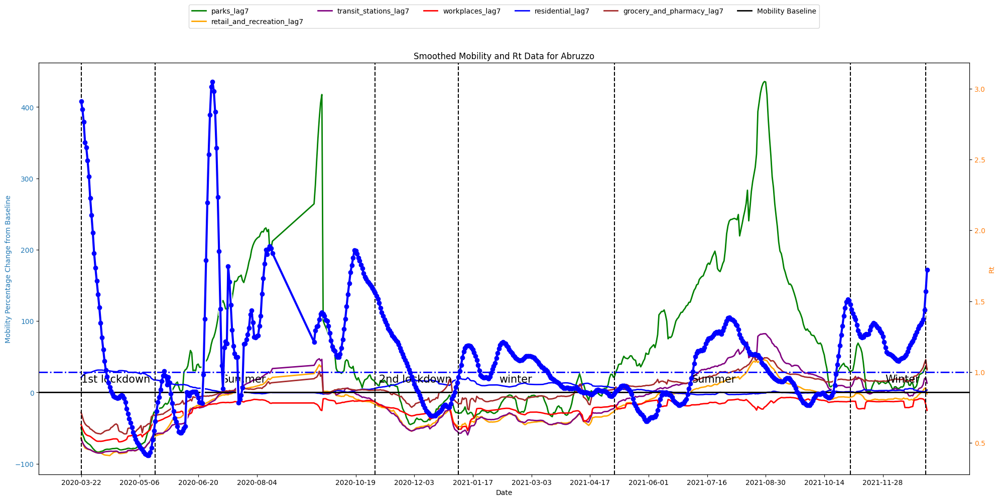

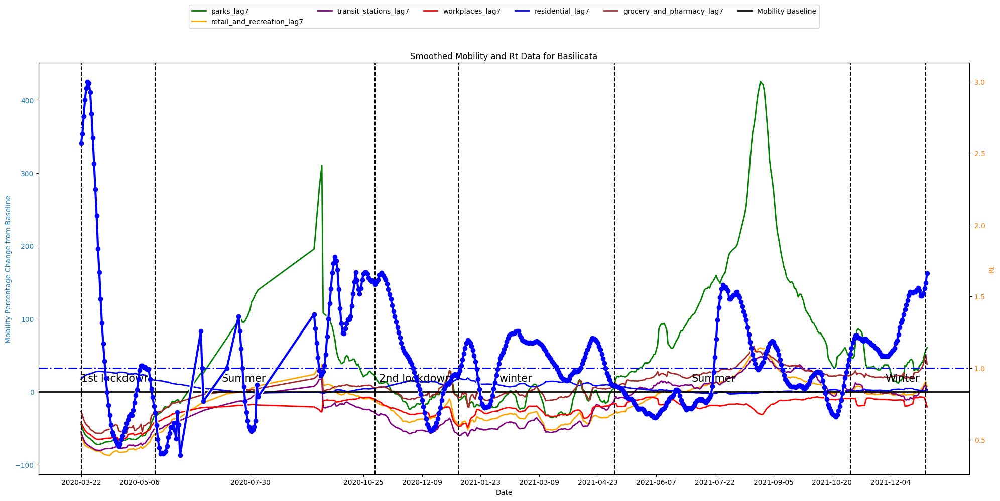

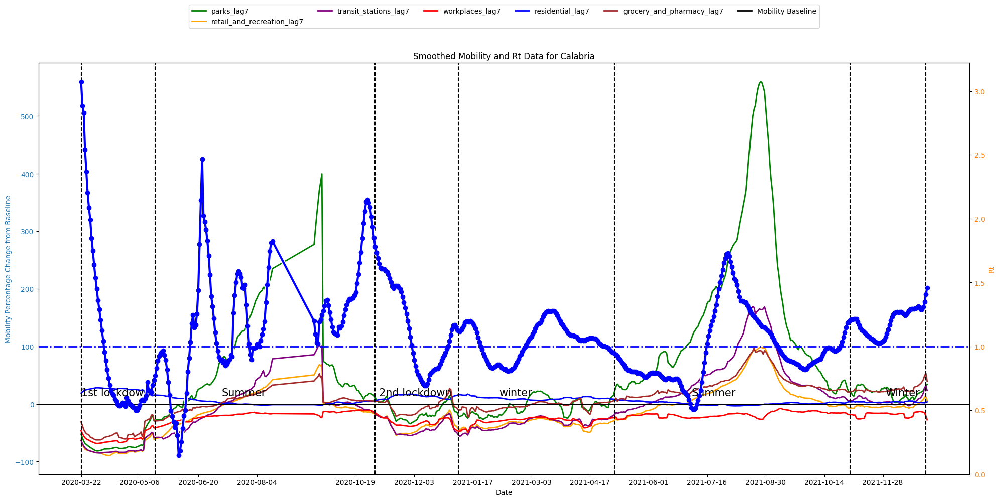

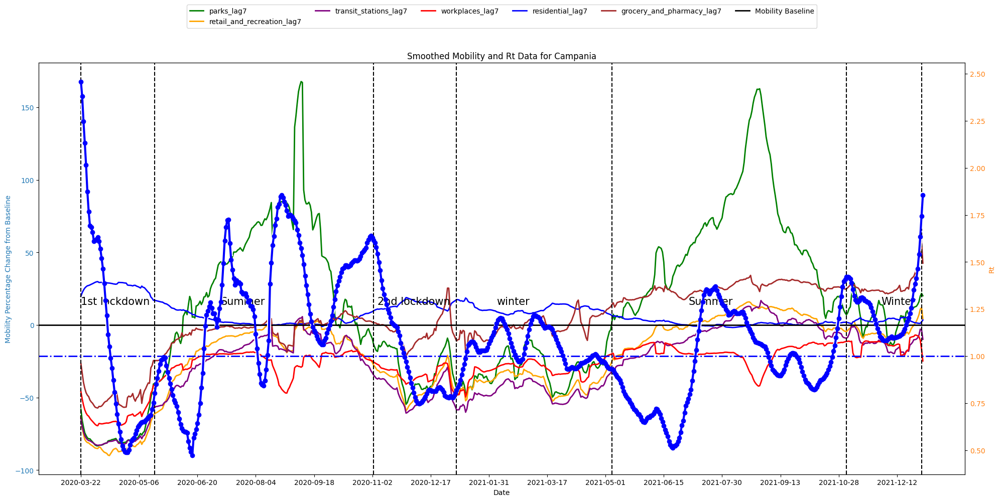

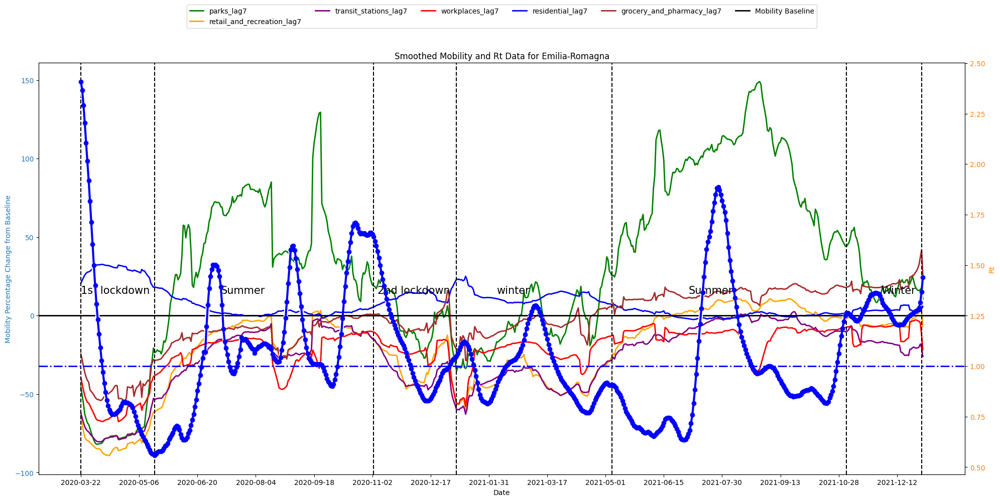

...

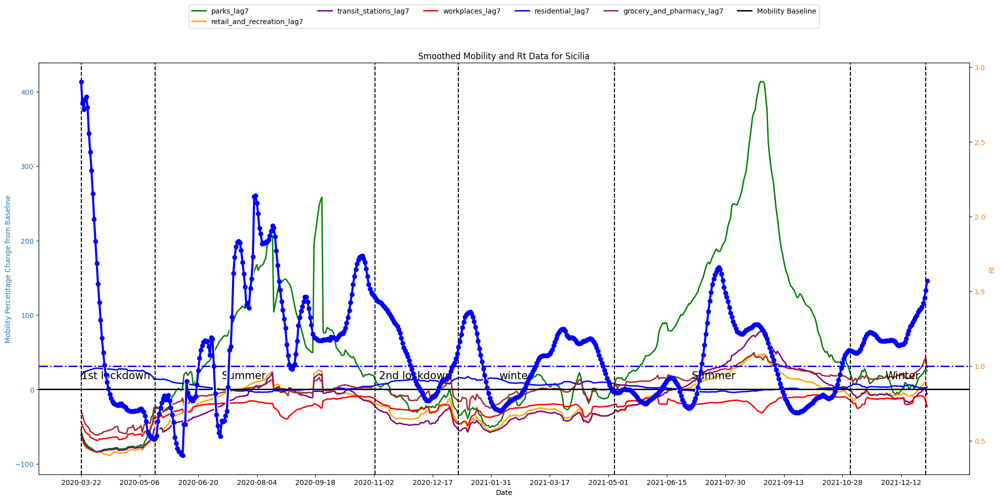

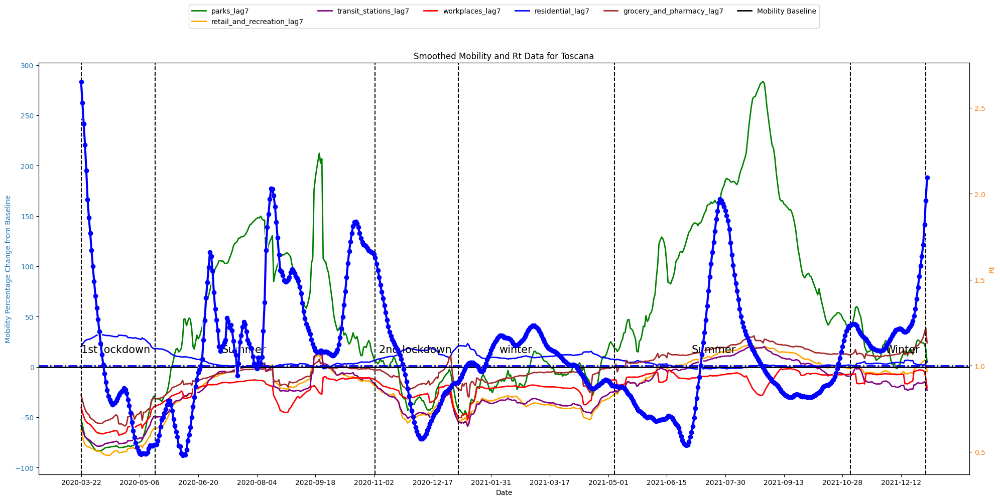

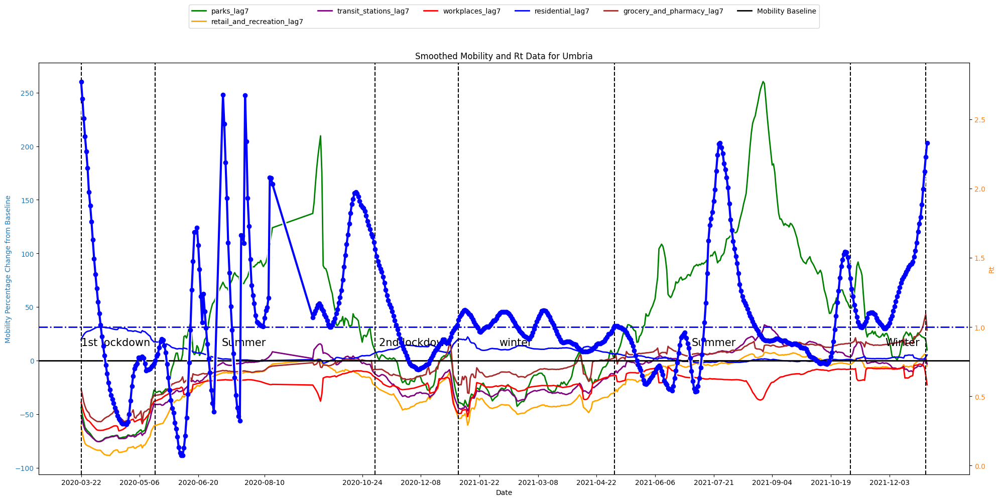

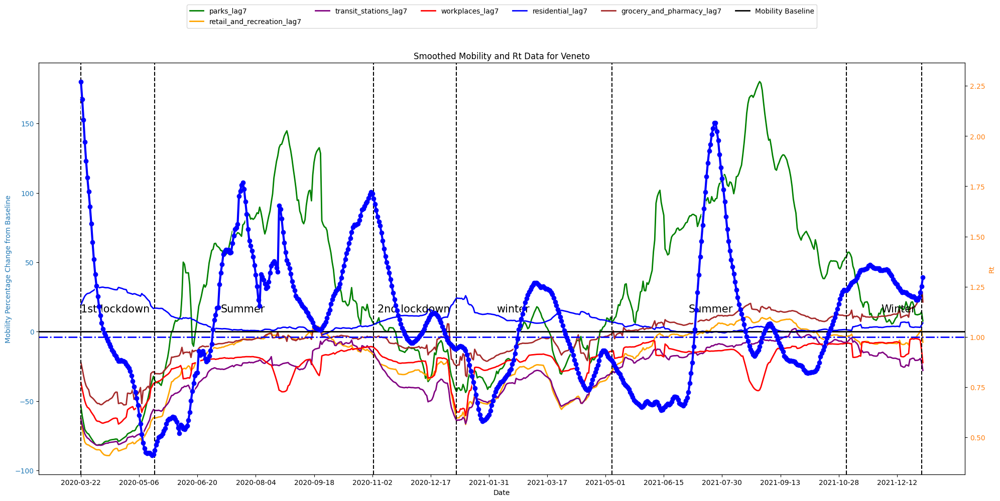

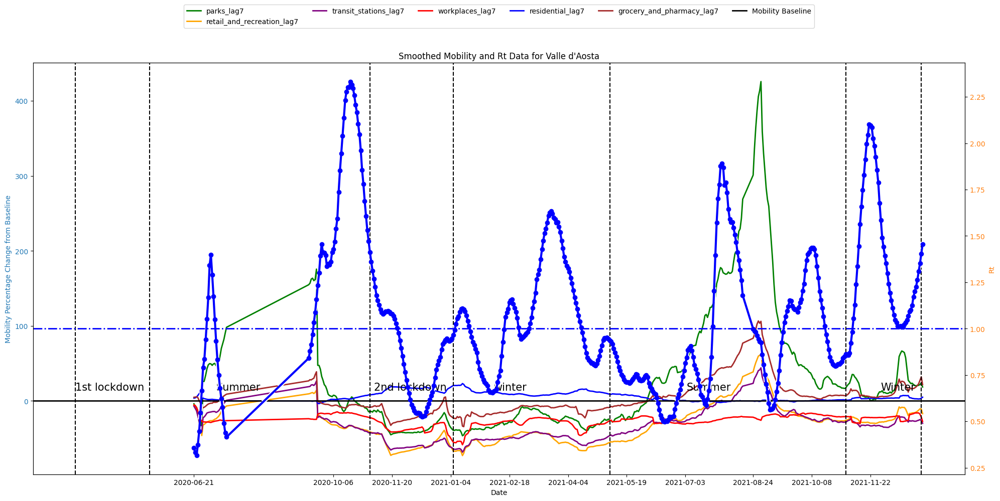

In [44]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Assuming your merged_data is a DataFrame containing the mentioned columns
# Replace 'merged_data.csv' with your actual file path or DataFrame variable

# Convert 'date' column to datetime
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Filter data until 01-01-2022
filtered_data = merged_data[merged_data['date'] <= '2022-01-01']

# Interpolate missing values for smoother lines
filtered_data_interpolated = filtered_data.interpolate(method='linear')

# Define custom colors for the mobility categories
mobility_colors = {
    'parks_lag7': 'green',
    'retail_and_recreation_lag7': 'orange',
    'transit_stations_lag7': 'purple',
    'workplaces_lag7': 'red',
    'residential_lag7': 'blue',
    'grocery_and_pharmacy_lag7': 'brown'
}

# Iterate through unique regions
for region in filtered_data['sub_region_1'].unique():
    # Filter data for the current region
    region_data = filtered_data[filtered_data['sub_region_1'] == region]

    # Create a figure and axis with larger size
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot mobility data on the first y-axis with thicker lines and assigned colors
    mobility_columns = ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                        'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']

    for i, column in enumerate(mobility_columns):
        ax1.plot(region_data['date'], region_data[column], label=column, linewidth=2, color=mobility_colors.get(column, 'gray'))

    # Add a horizontal line at y=0 for mobility baseline with a different style
    ax1.axhline(0, color='black', linestyle='-', linewidth=2, label='Mobility Baseline')

    # Customize the first y-axis
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Mobility Percentage Change from Baseline', color='tab:blue')
    ax1.tick_params(axis='y', labelcolor='tab:blue')

    # Move the mobility legend to the center top of the plot
    ax1.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=len(mobility_columns))

    # Create a second y-axis for Rt data with a different linestyle and thicker line
    ax2 = ax1.twinx()

    # Plot Rt with a border
    ax2.plot(region_data['date'], region_data['rt'], label='Rt', linestyle='--', color='white', linewidth=6)
    ax2.plot(region_data['date'], region_data['rt'], label='Rt', marker='o', linestyle='-', color='b', linewidth=3)

    # Add a horizontal line at y=1 for Rt with a different style
    ax2.axhline(1, color='b', linestyle='-.', linewidth=2, label='Rt = 1')

    # Customize the second y-axis
    ax2.set_ylabel('Rt', color='tab:orange')
    ax2.tick_params(axis='y', labelcolor='tab:orange')

    # Title
    plt.title(f'Smoothed Mobility and Rt Data for {region}')

    # Add vertical lines and text annotations for lockdown periods
    ax1.axvline(x=pd.to_datetime('2020-03-22'), color='black', linestyle='--', label='Lockdown Start')
    ax1.axvline(x=pd.to_datetime('2020-05-18'), color='black', linestyle='--', label='Lockdown End / Summer Start')
    ax1.axvline(x=pd.to_datetime('2020-11-03'), color='black', linestyle='--', label='Lockdown Start')
    ax1.axvline(x=pd.to_datetime('2021-01-06'), color='black', linestyle='--', label='Lockdown End / Winter Start')
    ax1.axvline(x=pd.to_datetime('2021-05-06'), color='black', linestyle='--', label='Lockdown Start')
    ax1.axvline(x=pd.to_datetime('2021-11-03'), color='black', linestyle='--', label='Lockdown End / Winter Start')
    ax1.axvline(x=pd.to_datetime('2021-12-31'), color='black', linestyle='--', label='Lockdown End / Year End')

    # Add text annotations
    ax1.text(x=pd.to_datetime('2020-03-22'), y=14, s="1st lockdown", color='black', size=15)
    ax1.text(x=pd.to_datetime('2020-07-08'), y=14, s="Summer", color='black', size=15)
    ax1.text(x=pd.to_datetime('2020-11-06'), y=14, s="2nd lockdown", color='black', size=15)
    ax1.text(x=pd.to_datetime('2021-02-06'), y=14, s="winter", color='black', size=15)
    ax1.text(x=pd.to_datetime('2021-07-04'), y=14, s="Summer", color='black', size=15)
    ax1.text(x=pd.to_datetime('2021-11-30'), y=14, s="Winter", color='black', size=15)

    # Set x-axis ticks at every 30 days (adjust as needed)
    ax1.set_xticks(region_data['date'][::45])

    # Show the plot with tight layout adjustment
    plt.tight_layout(pad=1)
    plt.show()


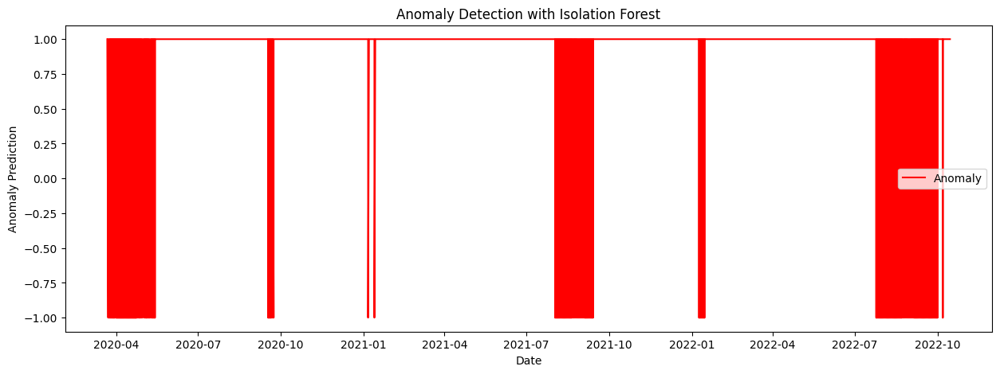

In [45]:
from sklearn.ensemble import IsolationForest

# Assuming merged_data is your DataFrame with the relevant columns
mobility_columns = ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                    'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']

# Create a subset of data for anomaly detection (using mobility columns)
anomaly_data = merged_data[mobility_columns]

# Initialize the Isolation Forest model
isolation_forest = IsolationForest(contamination=0.05, random_state=42)

# Fit the model
isolation_forest.fit(anomaly_data)

# Predict anomalies (1 for normal, -1 for anomalies)
anomaly_predictions = isolation_forest.predict(anomaly_data)

# Add the anomaly predictions to your DataFrame
merged_data['Anomaly'] = anomaly_predictions

# Visualize anomalies over time
plt.figure(figsize=(15, 5))
plt.plot(merged_data['date'], merged_data['Anomaly'], label='Anomaly', color='red')
plt.title('Anomaly Detection with Isolation Forest')
plt.xlabel('Date')
plt.ylabel('Anomaly Prediction')
plt.legend()
plt.show()


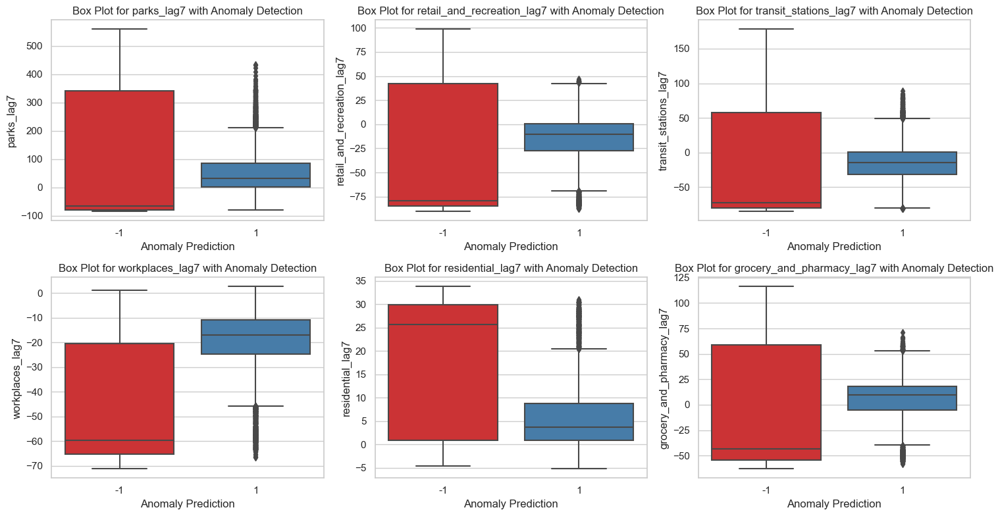

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest

# Assuming merged_data is your DataFrame with the relevant columns
mobility_columns = ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                    'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']

# Create a subset of data for anomaly detection (using mobility columns)
anomaly_data = merged_data[mobility_columns]

# Initialize the Isolation Forest model
isolation_forest = IsolationForest(contamination=0.05, random_state=42)

# Fit the model
isolation_forest.fit(anomaly_data)

# Predict anomalies (1 for normal, -1 for anomalies)
anomaly_predictions = isolation_forest.predict(anomaly_data)

# Add the anomaly predictions to your DataFrame
merged_data['Anomaly'] = anomaly_predictions

# Visualize anomalies using box plots for each mobility column
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

for column in mobility_columns:
    plt.subplot(2, 3, mobility_columns.index(column) + 1)
    sns.boxplot(x='Anomaly', y=column, data=merged_data, palette="Set1")
    plt.title(f'Box Plot for {column} with Anomaly Detection')
    plt.xlabel('Anomaly Prediction')
    plt.ylabel(column)

plt.tight_layout()
plt.show()


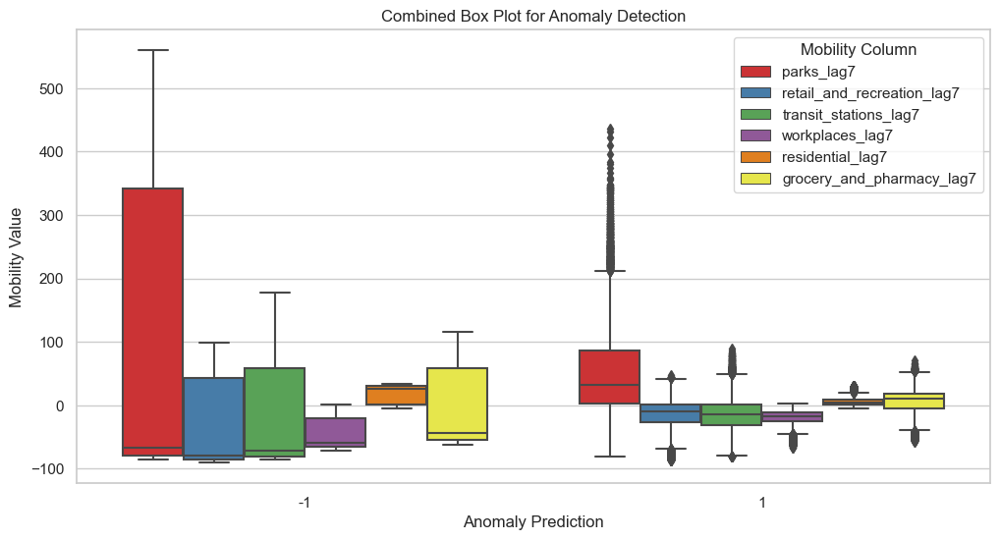

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest

# Assuming merged_data is your DataFrame with the relevant columns
mobility_columns = ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                    'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']

# Create a subset of data for anomaly detection (using mobility columns)
anomaly_data = merged_data[mobility_columns]

# Initialize the Isolation Forest model
isolation_forest = IsolationForest(contamination=0.05, random_state=42)

# Fit the model
isolation_forest.fit(anomaly_data)

# Predict anomalies (1 for normal, -1 for anomalies)
anomaly_predictions = isolation_forest.predict(anomaly_data)

# Add the anomaly predictions to your DataFrame
merged_data['Anomaly'] = anomaly_predictions

# Visualize anomalies using a combined box plot for all mobility columns
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

sns.boxplot(x='Anomaly', y='value', hue='variable',
            data=pd.melt(merged_data[mobility_columns].assign(Anomaly=anomaly_predictions),
                         id_vars='Anomaly', var_name='variable', value_name='value'),
            palette="Set1")
plt.title('Combined Box Plot for Anomaly Detection')
plt.xlabel('Anomaly Prediction')
plt.ylabel('Mobility Value')
plt.legend(title='Mobility Column', loc='upper right')
plt.show()


<Figure size 1500x800 with 0 Axes>

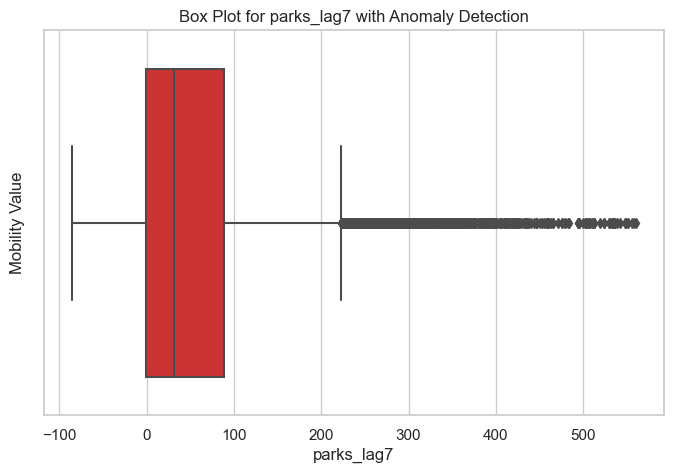

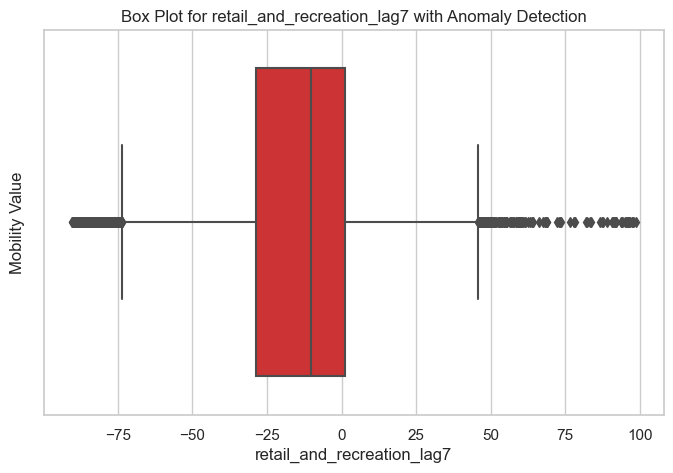

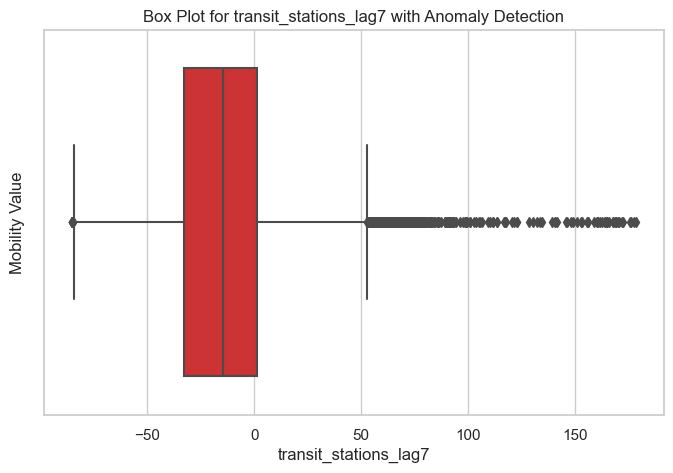

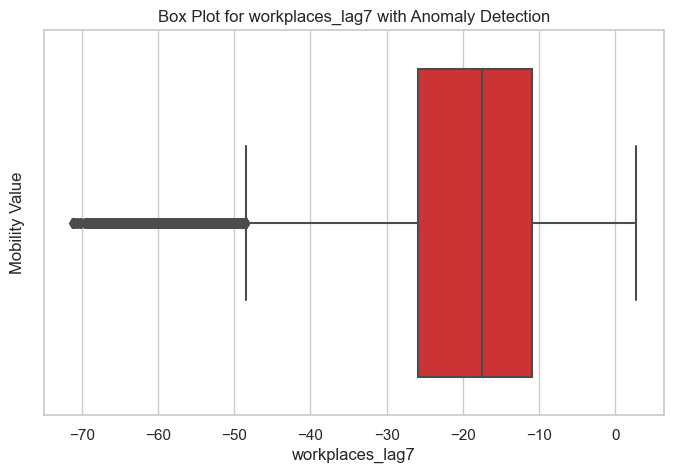

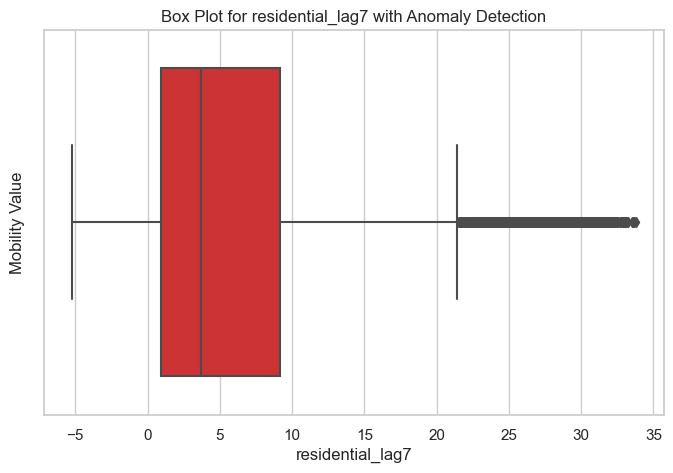

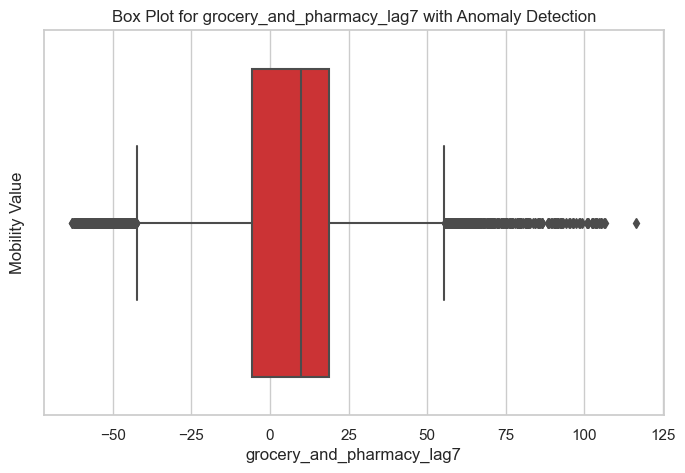

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest

# Assuming merged_data is your DataFrame with the relevant columns
mobility_columns = ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                    'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']

# Create a subset of data for anomaly detection (using mobility columns)
anomaly_data = merged_data[mobility_columns]

# Initialize the Isolation Forest model
isolation_forest = IsolationForest(contamination=0.05, random_state=42)

# Fit the model
isolation_forest.fit(anomaly_data)

# Predict anomalies (1 for normal, -1 for anomalies)
anomaly_predictions = isolation_forest.predict(anomaly_data)

# Add the anomaly predictions to your DataFrame
merged_data['Anomaly'] = anomaly_predictions

# Visualize anomalies using a box plot for each mobility column
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

for column in mobility_columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=column, data=merged_data, palette="Set1")
    plt.title(f'Box Plot for {column} with Anomaly Detection')
    plt.xlabel(column)
    plt.ylabel('Mobility Value')

plt.show()


<Figure size 1500x800 with 0 Axes>

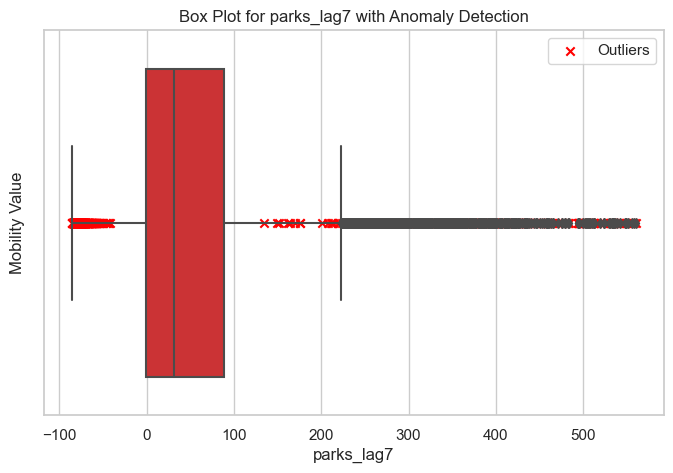

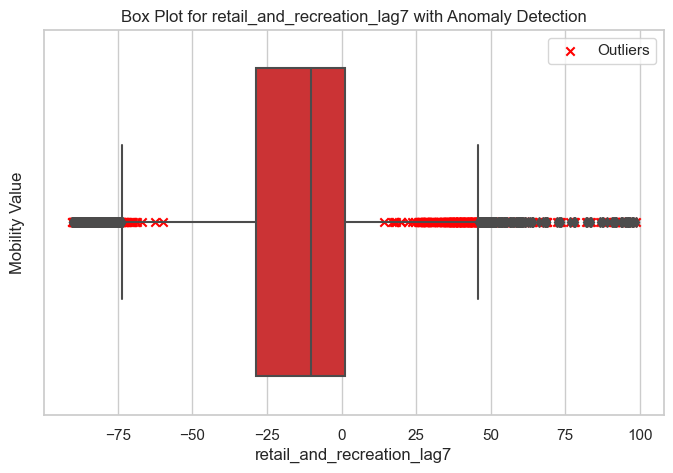

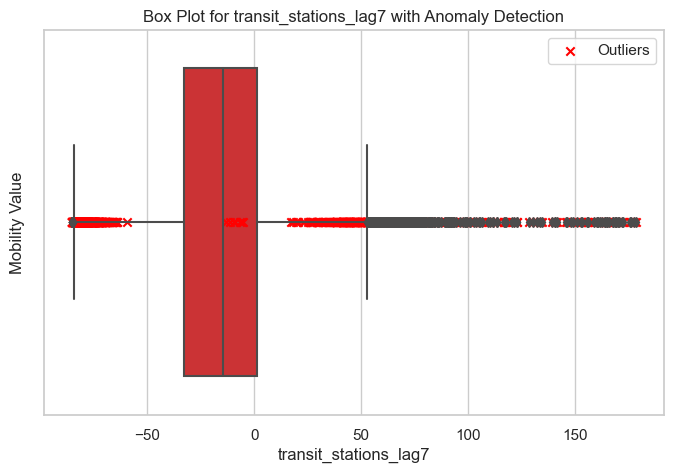

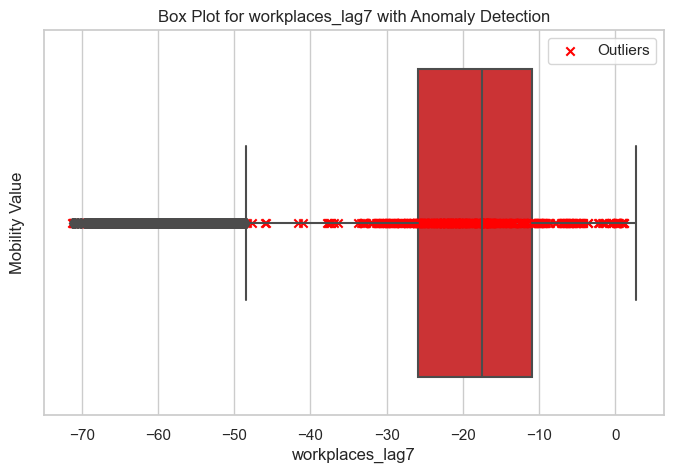

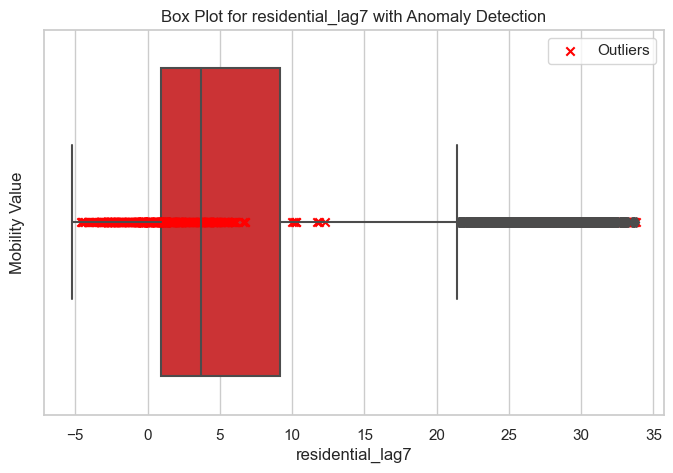

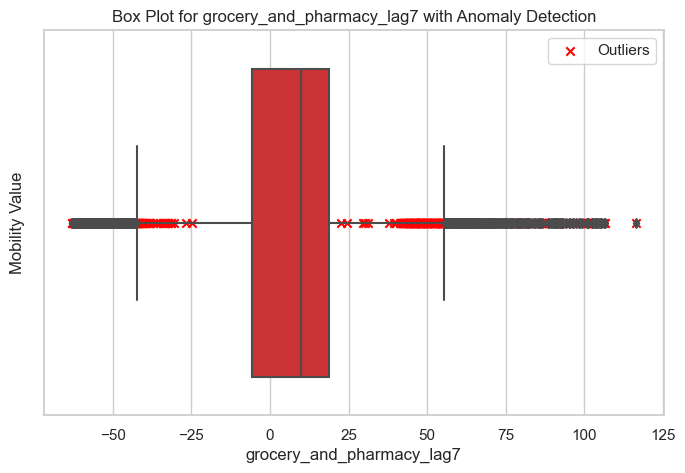

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest

# Assuming merged_data is your DataFrame with the relevant columns
mobility_columns = ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                    'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']

# Create a subset of data for anomaly detection (using mobility columns)
anomaly_data = merged_data[mobility_columns]

# Initialize the Isolation Forest model
isolation_forest = IsolationForest(contamination=0.05, random_state=42)

# Fit the model
isolation_forest.fit(anomaly_data)

# Predict anomalies (1 for normal, -1 for anomalies)
anomaly_predictions = isolation_forest.predict(anomaly_data)

# Add the anomaly predictions to your DataFrame
merged_data['Anomaly'] = anomaly_predictions

# Visualize anomalies using a box plot for each mobility column
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

for column in mobility_columns:
    plt.figure(figsize=(8, 5))
    
    # Create a DataFrame with date, mobility column, and anomaly prediction
    data_to_plot = merged_data[['date', column, 'Anomaly']]
    
    # Filter only rows with anomalies
    outliers = data_to_plot[data_to_plot['Anomaly'] == -1]
    
    # Plot box plot
    sns.boxplot(x=column, data=data_to_plot, palette="Set1")
    
    # Highlight outliers on the box plot
    plt.scatter(outliers[column], [0] * len(outliers), color='red', marker='x', label='Outliers')
    
    plt.title(f'Box Plot for {column} with Anomaly Detection')
    plt.xlabel(column)
    plt.ylabel('Mobility Value')
    plt.legend()
    plt.show()


<Figure size 1500x800 with 0 Axes>

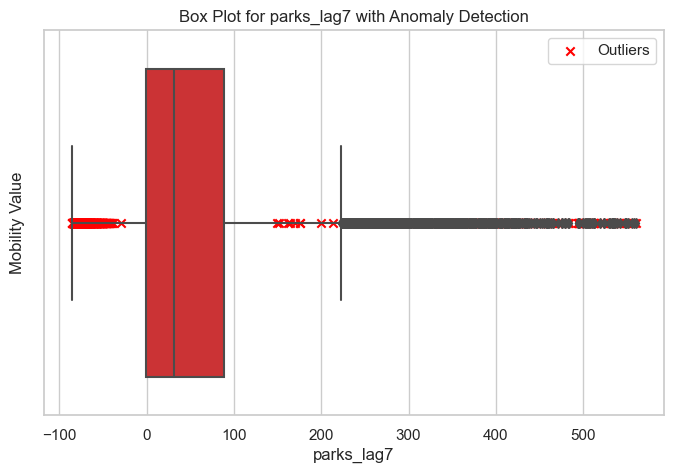

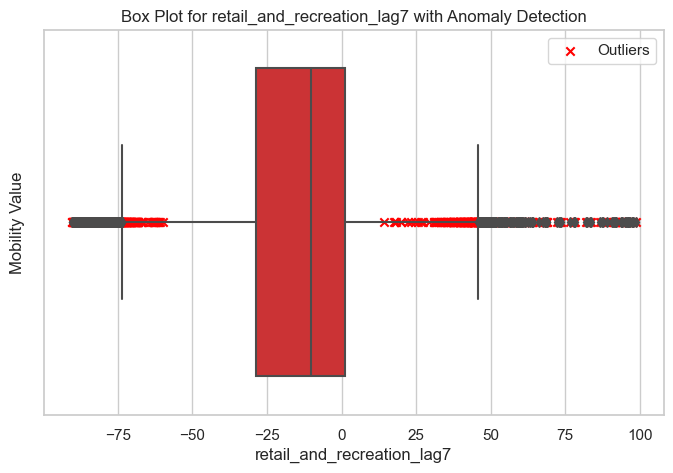

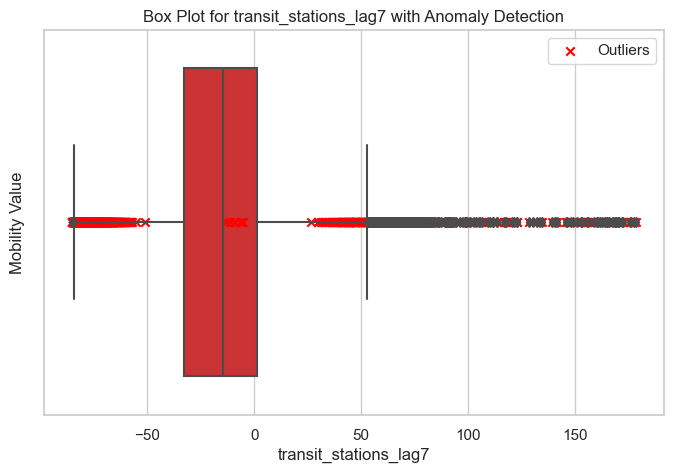

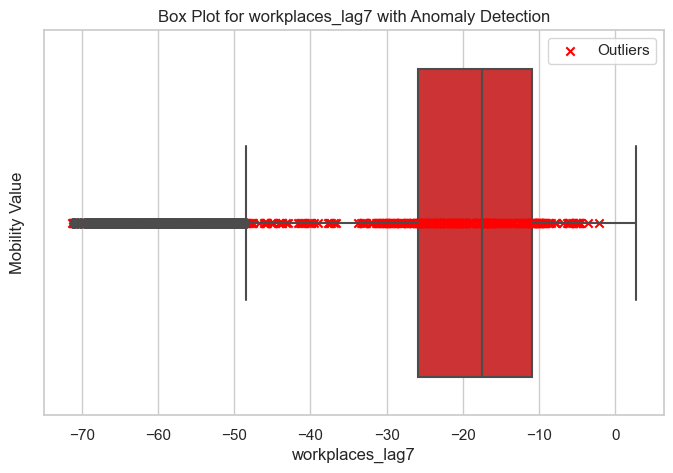

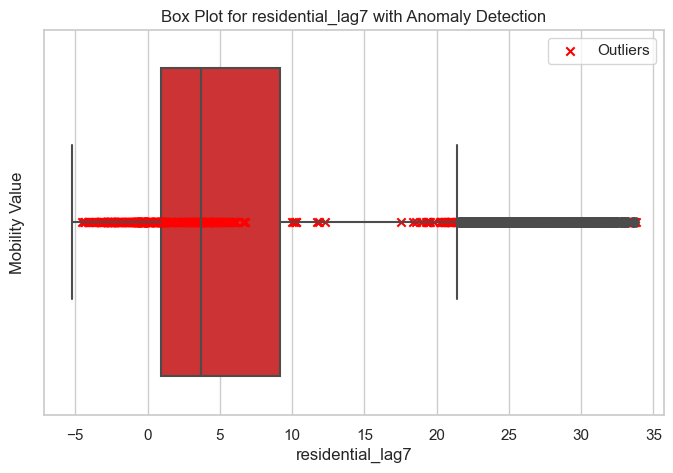

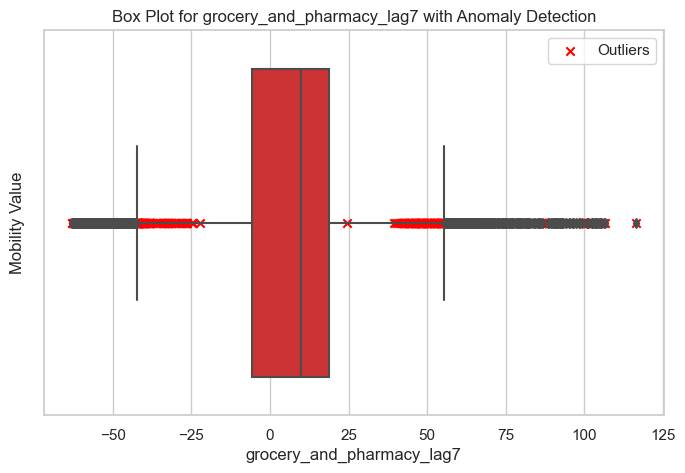

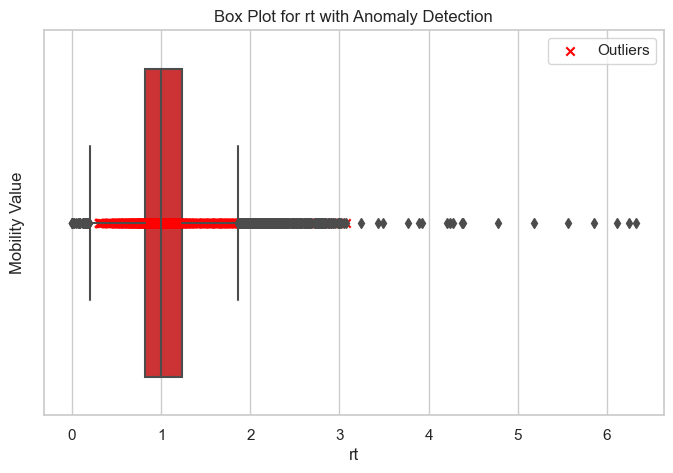

Outliers for parks_lag7:
            date  parks_lag7  Anomaly
0     2020-03-22  -49.714286       -1
2     2020-03-22  -52.535714       -1
3     2020-03-22  -58.023810       -1
4     2020-03-22  -45.528571       -1
6     2020-03-22  -48.642857       -1
...          ...         ...      ...
16606 2022-09-08  236.071429       -1
16617 2022-09-08  344.542857       -1
16625 2022-09-09  213.214286       -1
16636 2022-09-09  326.114286       -1
16644 2022-09-10  200.035714       -1

[867 rows x 3 columns]

Outliers for retail_and_recreation_lag7:
            date  retail_and_recreation_lag7  Anomaly
0     2020-03-22                  -62.857143       -1
2     2020-03-22                  -62.892857       -1
3     2020-03-22                  -63.309524       -1
4     2020-03-22                  -63.871429       -1
6     2020-03-22                  -61.595238       -1
...          ...                         ...      ...
16606 2022-09-08                   41.678571       -1
16617 2022-09-08     

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.ensemble import IsolationForest

# Assuming merged_data is your DataFrame with the relevant columns
mobility_columns = ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                    'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7', 'rt']

# Create a subset of data for anomaly detection (using mobility columns)
anomaly_data = merged_data[mobility_columns]

# Initialize the Isolation Forest model
isolation_forest = IsolationForest(contamination=0.05, random_state=42)

# Fit the model
isolation_forest.fit(anomaly_data)

# Predict anomalies (1 for normal, -1 for anomalies)
anomaly_predictions = isolation_forest.predict(anomaly_data)

# Add the anomaly predictions to your DataFrame
merged_data['Anomaly'] = anomaly_predictions

# Create a dictionary to store outliers for each mobility column
outliers_dict = {}

# Visualize anomalies using a box plot for each mobility column
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

for column in mobility_columns:
    plt.figure(figsize=(8, 5))
    
    # Create a DataFrame with date, mobility column, and anomaly prediction
    data_to_plot = merged_data[['date', column, 'Anomaly']]
    
    # Filter only rows with anomalies
    outliers = data_to_plot[data_to_plot['Anomaly'] == -1]
    
    # Save outliers to the dictionary
    outliers_dict[column] = outliers
    
    # Plot box plot
    sns.boxplot(x=column, data=data_to_plot, palette="Set1")
    
    # Highlight outliers on the box plot
    plt.scatter(outliers[column], [0] * len(outliers), color='red', marker='x', label='Outliers')
    
    plt.title(f'Box Plot for {column} with Anomaly Detection')
    plt.xlabel(column)
    plt.ylabel('Mobility Value')
    plt.legend()
    plt.show()

# Access outliers DataFrames for each column
for column, outliers_df in outliers_dict.items():
    print(f"Outliers for {column}:\n{outliers_df}\n")


In [63]:
outliers_dict.values()

dict_values([            date  parks_lag7  Anomaly
0     2020-03-22  -49.714286       -1
2     2020-03-22  -52.535714       -1
3     2020-03-22  -58.023810       -1
4     2020-03-22  -45.528571       -1
6     2020-03-22  -48.642857       -1
...          ...         ...      ...
16606 2022-09-08  236.071429       -1
16617 2022-09-08  344.542857       -1
16625 2022-09-09  213.214286       -1
16636 2022-09-09  326.114286       -1
16644 2022-09-10  200.035714       -1

[867 rows x 3 columns],             date  retail_and_recreation_lag7  Anomaly
0     2020-03-22                  -62.857143       -1
2     2020-03-22                  -62.892857       -1
3     2020-03-22                  -63.309524       -1
4     2020-03-22                  -63.871429       -1
6     2020-03-22                  -61.595238       -1
...          ...                         ...      ...
16606 2022-09-08                   41.678571       -1
16617 2022-09-08                   36.485714       -1
16625 2022-09-09    

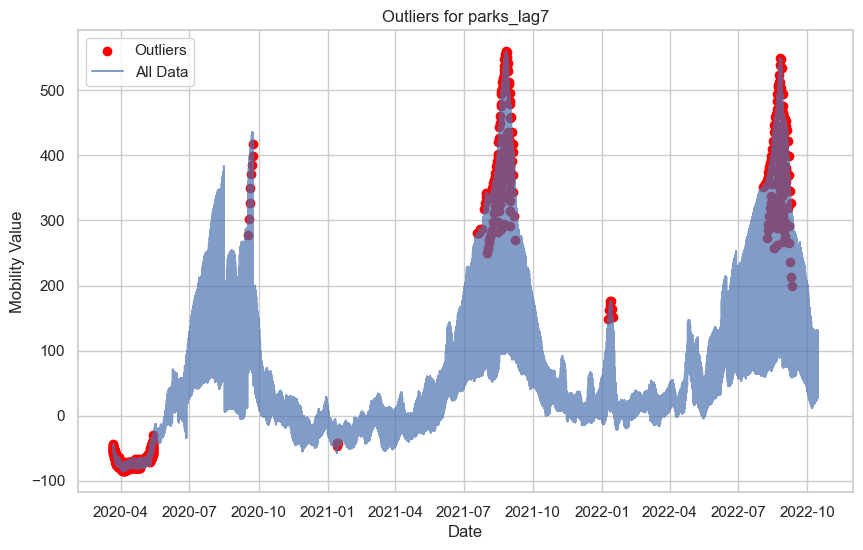

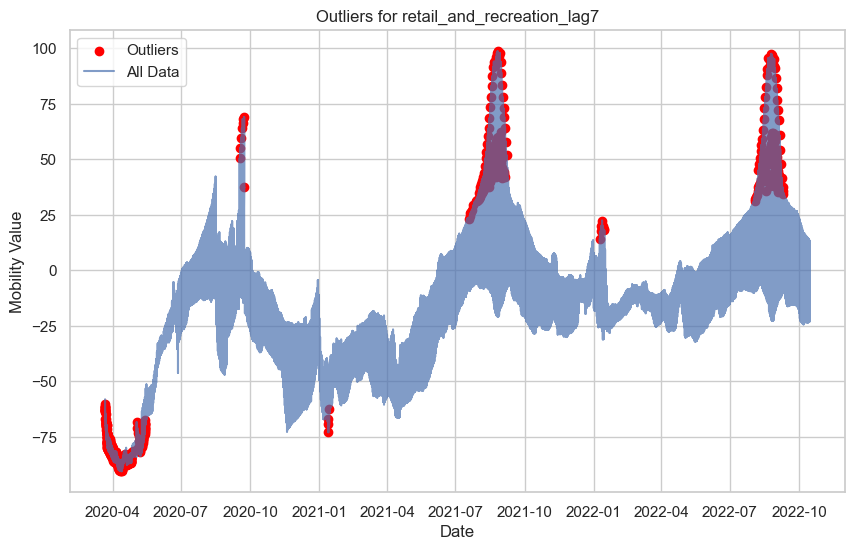

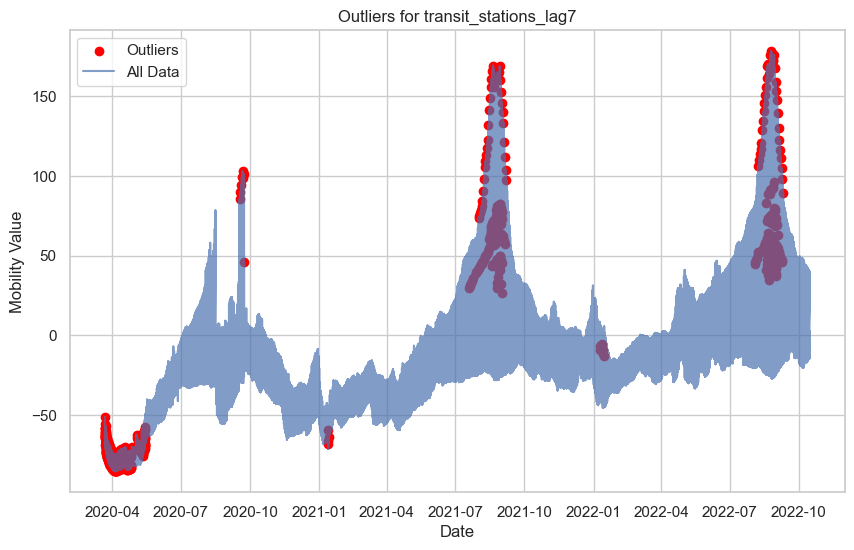

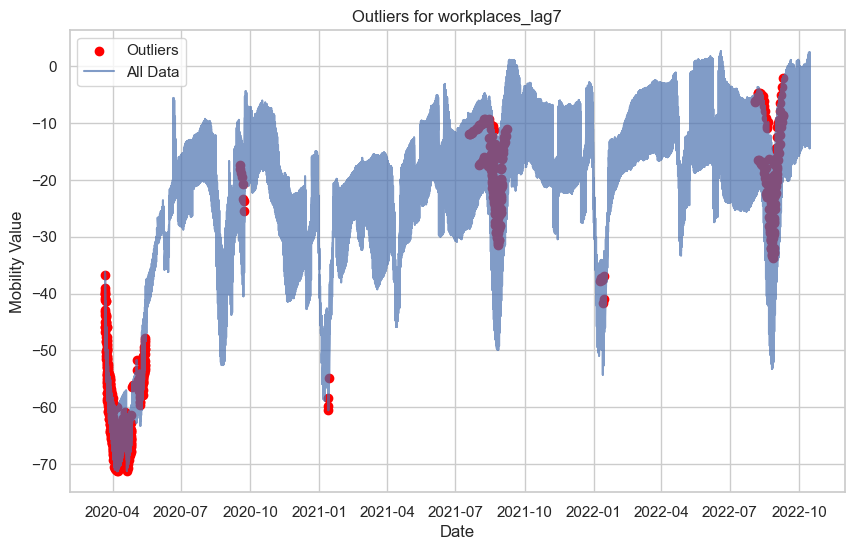

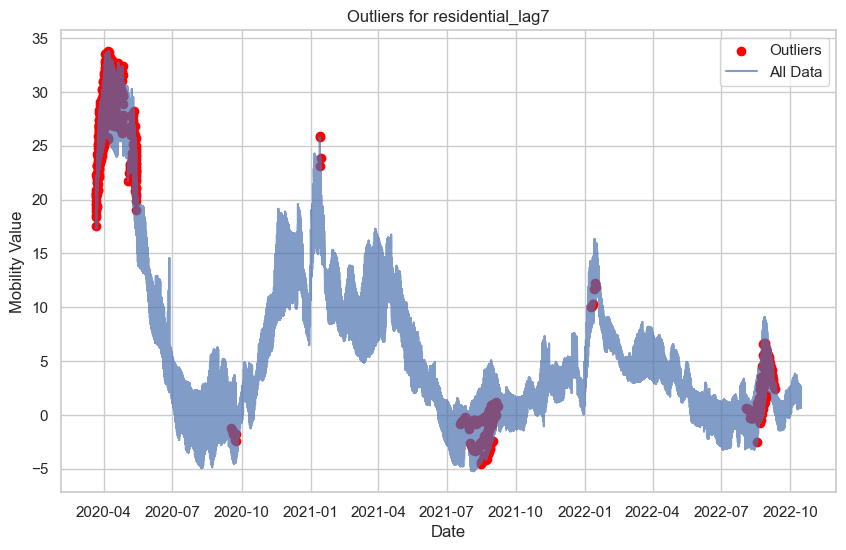

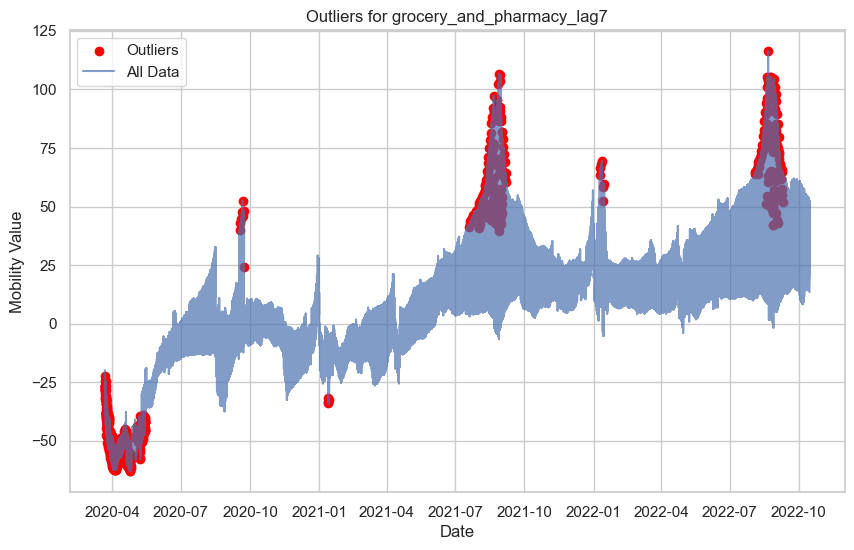

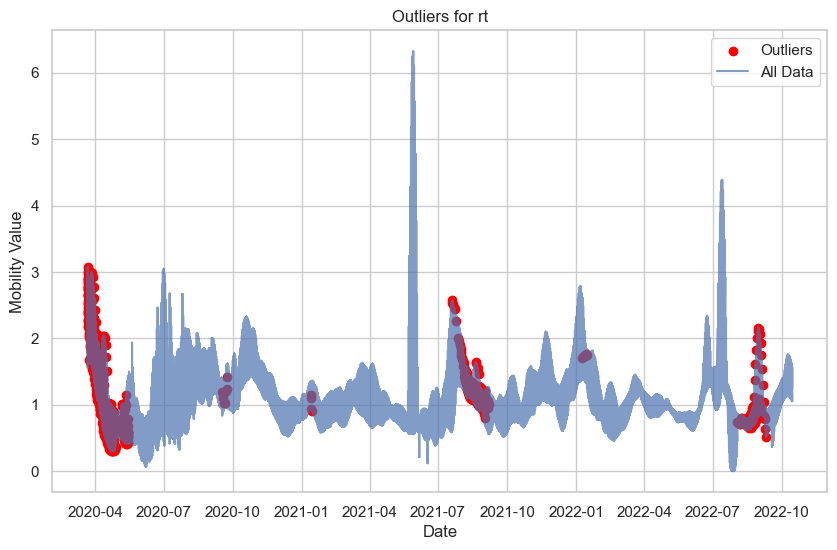

In [64]:
import matplotlib.pyplot as plt

# Assuming outliers_dict is the dictionary containing outliers for each column
# (as generated in the previous code)

# Visualize outliers for each mobility column
for column, outliers_df in outliers_dict.items():
    plt.figure(figsize=(10, 6))
    
    plt.scatter(outliers_df['date'], outliers_df[column], color='red', label='Outliers')
    plt.plot(merged_data['date'], merged_data[column], label='All Data', alpha=0.7)
    
    plt.title(f'Outliers for {column}')
    plt.xlabel('Date')
    plt.ylabel('Mobility Value')
    plt.legend()
    
    plt.show()


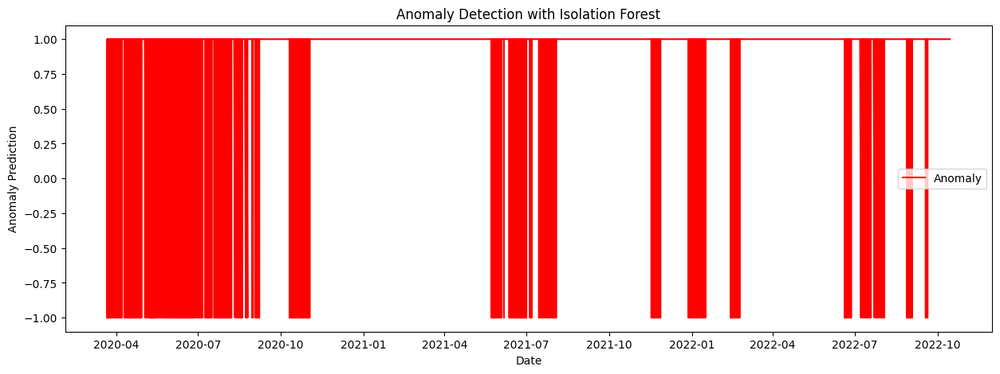

In [14]:
from sklearn.ensemble import IsolationForest

# Assuming merged_data is your DataFrame with the relevant columns
mobility_columns = ['rt']

# Create a subset of data for anomaly detection (using mobility columns)
anomaly_data = merged_data[mobility_columns]

# Initialize the Isolation Forest model
isolation_forest = IsolationForest(contamination=0.05, random_state=42)

# Fit the model
isolation_forest.fit(anomaly_data)

# Predict anomalies (1 for normal, -1 for anomalies)
anomaly_predictions = isolation_forest.predict(anomaly_data)

# Add the anomaly predictions to your DataFrame
merged_data['Anomaly'] = anomaly_predictions

# Visualize anomalies over time
plt.figure(figsize=(15, 5))
plt.plot(merged_data['date'], merged_data['Anomaly'], label='Anomaly', color='red')
plt.title('Anomaly Detection with Isolation Forest')
plt.xlabel('Date')
plt.ylabel('Anomaly Prediction')
plt.legend()
plt.show()

c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py:110: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py", line 217, in _count_physical_cores
    raise ValueError(


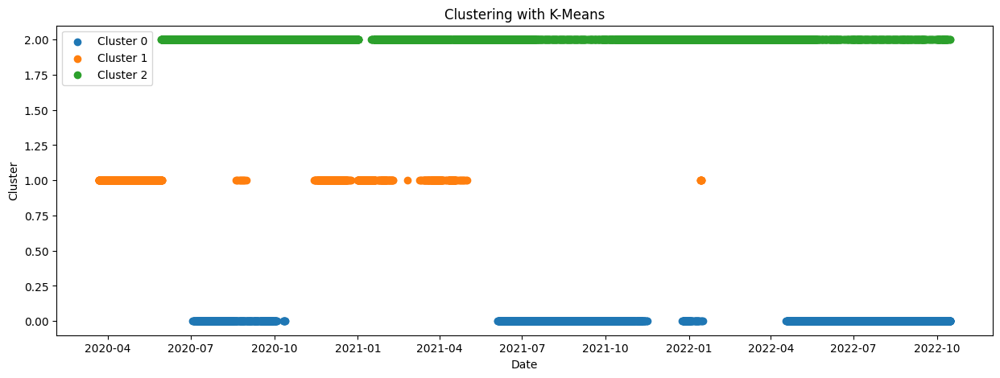

In [13]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Create a subset of data for clustering (using mobility columns)
cluster_data = merged_data[mobility_columns]

# Standardize the data
scaler = StandardScaler()
cluster_data_standardized = scaler.fit_transform(cluster_data)

# Initialize the K-Means model with the desired number of clusters
num_clusters = 3  # You can adjust this based on your analysis
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit the model
cluster_labels = kmeans.fit_predict(cluster_data_standardized)

# Add the cluster labels to your DataFrame
merged_data['Cluster'] = cluster_labels

# Visualize clusters over time
plt.figure(figsize=(15, 5))
for cluster in range(num_clusters):
    cluster_subset = merged_data[merged_data['Cluster'] == cluster]
    plt.scatter(cluster_subset['date'], cluster_subset['Cluster'], label=f'Cluster {cluster}')

plt.title('Clustering with K-Means')
plt.xlabel('Date')
plt.ylabel('Cluster')
plt.legend()
plt.show()


c:\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Python311\Lib\site-packages\statsmodels\tsa\base\

Mean Squared Error (ARIMA): 0.09316135510246447
R-squared (ARIMA): -0.028201917847718194


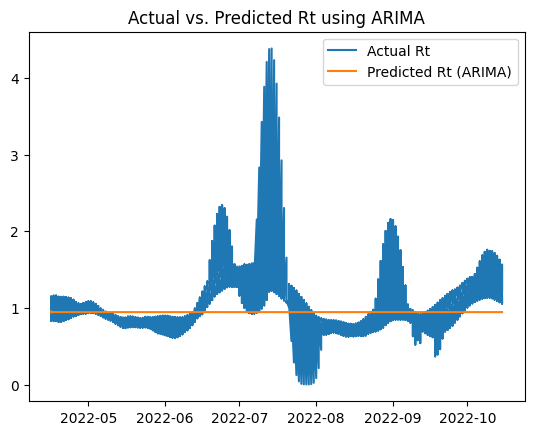

In [15]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming 'merged_data' contains your dataset with relevant columns, including 'rt'
# Make sure the dataset is preprocessed and features are prepared.

# Assuming 'date' is a datetime column, set it as the index
merged_data.set_index('date', inplace=True)

# Define the Rt time series
rt_series = merged_data['rt']

# Split the data into training and testing sets
train_size = int(len(rt_series) * 0.8)
train, test = rt_series[:train_size], rt_series[train_size:]

# Fit ARIMA model
order = (5, 1, 1)  # Example order, you may need to tune this
arima_model = ARIMA(train, order=order)
arima_fit = arima_model.fit()

# Make predictions
arima_predictions = arima_fit.predict(start=len(train), end=len(train) + len(test) - 1, typ='levels')

# Evaluate the model performance
mse_arima = mean_squared_error(test, arima_predictions)
r2_arima = r2_score(test, arima_predictions)

print(f'Mean Squared Error (ARIMA): {mse_arima}')
print(f'R-squared (ARIMA): {r2_arima}')

# Plot actual vs. predicted Rt values
plt.plot(test.index, test, label='Actual Rt')
plt.plot(test.index, arima_predictions, label='Predicted Rt (ARIMA)')
plt.legend()
plt.title('Actual vs. Predicted Rt using ARIMA')
plt.show()


Certainly! Building a machine learning model for predicting Rt (Reproduction Number) and assessing the effect of lockdown on Rt involves several steps. Below, I'll provide a simplified example using a linear regression model for Rt prediction and incorporating lockdown-related features.

Machine Learning Model for Rt Prediction:


Mean Squared Error: 0.13752514657897605
R-squared: 0.031171022768595513


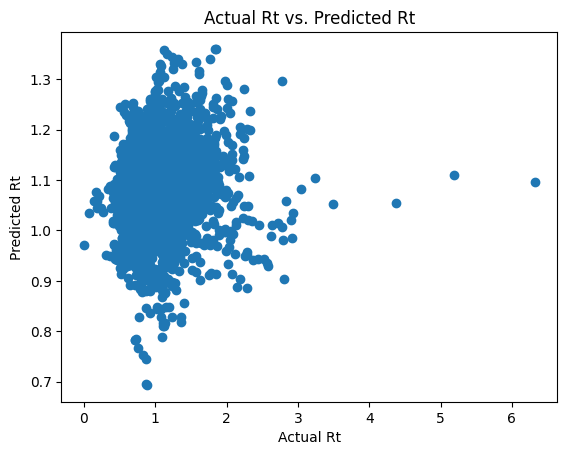

In [16]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming 'merged_data' contains your dataset with relevant columns, including 'rt' and lockdown-related features
# Make sure the dataset is preprocessed and features are prepared.

# Features for Rt prediction (example, you can customize based on your dataset)
rt_features = ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
               'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(merged_data[rt_features], merged_data['rt'], test_size=0.2, random_state=42)

# Initialize and train a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
rt_predictions = model.predict(X_test)

# Evaluate the model performance
mse = mean_squared_error(y_test, rt_predictions)
r2 = r2_score(y_test, rt_predictions)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Visualize predictions vs. actual Rt
plt.scatter(y_test, rt_predictions)
plt.xlabel('Actual Rt')
plt.ylabel('Predicted Rt')
plt.title('Actual Rt vs. Predicted Rt')
plt.show()


In [18]:
print(merged_data.columns)


Index(['sub_region_1', 'retail_and_recreation', 'grocery_and_pharmacy',
       'parks', 'transit_stations', 'workplaces', 'residential', 'parks_lag7',
       'retail_and_recreation_lag7', 'transit_stations_lag7',
       'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7',
       'retail_and_recreation_lag14', 'parks_lag14', 'transit_stations_lag14',
       'workplaces_lag14', 'residential_lag14', 'grocery_and_pharmacy_lag14',
       'retail_and_recreation_lag10', 'parks_lag10', 'transit_stations_lag10',
       'workplaces_lag10', 'residential_lag10', 'grocery_and_pharmacy_lag10',
       'retail_and_recreation_lag28', 'parks_lag28', 'transit_stations_lag28',
       'workplaces_lag28', 'residential_lag28', 'grocery_and_pharmacy_lag28',
       'rt', 'Anomaly', 'Cluster'],
      dtype='object')


In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming 'merged_data' contains your dataset with relevant columns, including 'rt'
# Make sure the dataset is preprocessed and features are prepared.

# Assuming 'date' is a datetime column, set it as the index
merged_data.set_index('date', inplace=True)

# Define the lockdown periods
lockdown_periods = [('2020-03-22', '2020-05-18'), ('2020-11-06', '2021-01-20')]

# Create a binary variable indicating lockdown status
merged_data['lockdown'] = 0
for start_date, end_date in lockdown_periods:
    merged_data.loc[start_date:end_date, 'lockdown'] = 1

# Prepare features and target variable
X = merged_data.drop(['rt'], axis=1)  # Adjust this based on your actual features
y = merged_data['rt']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit Random Forest model
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Make predictions
y_pred = rf_model.predict(X_test)

# Evaluate the model performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot actual vs. predicted Rt values during lockdown and non-lockdown periods
plt.scatter(X_test.index, y_test, label='Actual Rt', alpha=0.7)
plt.scatter(X_test.index, y_pred, label='Predicted Rt', alpha=0.7)
plt.title('Actual vs. Predicted Rt During Lockdown and Non-Lockdown Periods')
plt.xlabel('Date')
plt.ylabel('Rt')
plt.legend()
plt.show()


ValueError: could not convert string to float: 'Toscana'

In [87]:
import pandas as pd

# Assuming your merged_data is a DataFrame containing the mentioned columns
# Replace 'merged_data.csv' with your actual file path or DataFrame variable


# Convert 'date' column to datetime
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the lockdown periods
lockdown_periods = [
    ('First Lockdown', '2020-03-22', '2020-05-18'),
    ('Summer 2020', '2020-05-18', '2020-11-03'),
    ('Second Lockdown', '2020-11-03', '2021-01-06'),
    ('Winter 2021', '2021-01-06', '2021-05-06'),
    ('Summer 2021', '2021-05-06', '2021-11-03'),
    ('Winter 2021-2022', '2021-11-03', '2021-12-31')
]

# Create a DataFrame to store the results
changes_df = pd.DataFrame(columns=['Period', 'Mobility Category', 'Change Description'])

# Iterate through lockdown periods
for period, start_date, end_date in lockdown_periods:
    # Filter data for the current period
    period_data = merged_data[(merged_data['date'] >= start_date) & (merged_data['date'] <= end_date)]

    # Calculate mobility change for each category
    for category in ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                     'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']:
        mobility_change = period_data[category].pct_change().mean()

        # Append results to the DataFrame with a description
        changes_df = pd.concat([changes_df, pd.DataFrame({'Period': [period], 'Mobility Category': [category], 'Change Description': [f'{category} changed by {mobility_change * 100:.2f}% in {period}']})], ignore_index=True)

    # Calculate Rt change
    rt_change = period_data['rt'].pct_change().mean()

    # Append results for Rt to the DataFrame with a description
    changes_df = pd.concat([changes_df, pd.DataFrame({'Period': [period], 'Mobility Category': ['Rt'], 'Change Description': [f'Rt changed by {rt_change * 100:.2f}% in {period}']})], ignore_index=True)

# Display the results
print(changes_df)


              Period           Mobility Category   
0     First Lockdown                  parks_lag7  \
1     First Lockdown  retail_and_recreation_lag7   
2     First Lockdown       transit_stations_lag7   
3     First Lockdown             workplaces_lag7   
4     First Lockdown            residential_lag7   
5     First Lockdown   grocery_and_pharmacy_lag7   
6     First Lockdown                          Rt   
7        Summer 2020                  parks_lag7   
8        Summer 2020  retail_and_recreation_lag7   
9        Summer 2020       transit_stations_lag7   
10       Summer 2020             workplaces_lag7   
11       Summer 2020            residential_lag7   
12       Summer 2020   grocery_and_pharmacy_lag7   
13       Summer 2020                          Rt   
14   Second Lockdown                  parks_lag7   
15   Second Lockdown  retail_and_recreation_lag7   
16   Second Lockdown       transit_stations_lag7   
17   Second Lockdown             workplaces_lag7   
18   Second 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your merged_data is a DataFrame containing the mentioned columns
# Replace 'merged_data.csv' with your actual file path or DataFrame variable

# Convert 'date' column to datetime
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the lockdown periods
lockdown_periods = [
    ('First Lockdown', '2020-03-22', '2020-05-18'),
    ('Summer 2020', '2020-05-18', '2020-11-03'),
    ('Second Lockdown', '2020-11-03', '2021-01-06'),
    ('Winter 2021', '2021-01-06', '2021-05-06'),
    ('Summer 2021', '2021-05-06', '2021-11-03'),
    ('Winter 2021-2022', '2021-11-03', '2021-12-31')
]

# Iterate through regions
for region in merged_data['sub_region_1'].unique():
    # Create a DataFrame to store the results for the current region
    changes_df = pd.DataFrame(columns=['Region', 'Period', 'Mobility Category', 'Change Description', 'Change Direction'])

    # Filter data for the current region
    region_data = merged_data[merged_data['sub_region_1'] == region]

    # Iterate through lockdown periods
    for period, start_date, end_date in lockdown_periods:
        # Filter data for the current period
        period_data = region_data[(region_data['date'] >= start_date) & (region_data['date'] <= end_date)]

        # Calculate mobility change for each category
        for category in ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                         'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']:
            mobility_change = period_data[category].pct_change().mean()

            # Determine the change direction
            change_direction = 'Increased' if mobility_change > 0 else ('Decreased' if mobility_change < 0 else 'No Change')

            # Append results to the DataFrame with a description and change direction
            changes_df = pd.concat([changes_df, pd.DataFrame({
                'Region': [region],
                'Period': [period],
                'Mobility Category': [category],
                'Change Description': [f'{category} changed by {mobility_change * 100:.2f}% in {period}'],
                'Change Direction': [change_direction]
            })], ignore_index=True)

        # Calculate Rt change
        rt_change = period_data['rt'].pct_change().mean()

        # Determine the change direction for Rt
        rt_change_direction = 'Increased' if rt_change > 0 else ('Decreased' if rt_change < 0 else 'No Change')

        # Append results for Rt to the DataFrame with a description and change direction
        changes_df = pd.concat([changes_df, pd.DataFrame({
            'Region': [region],
            'Period': [period],
            'Mobility Category': ['Rt'],
            'Change Description': [f'Rt changed by {rt_change * 100:.2f}% in {period}'],
            'Change Direction': [rt_change_direction]
        })], ignore_index=True)

    # Display the results for the current region
    print(f'\nChanges in Mobility Categories and Rt for {region}:\n')
    print(changes_df)

    # Convert 'Change Description' to numeric values
    changes_df['Change Description'] = pd.to_numeric(changes_df['Change Description'].str.extract('([-+]?\d*\.\d+|\d+)')[0])

    # Plotting changes using seaborn barplot
    plt.figure(figsize=(15, 8))
    sns.barplot(x='Period', y='Change Description', hue='Mobility Category', data=changes_df, palette='viridis', ci=None)

    # Customize the plot
    plt.title(f'Changes in Mobility Categories and Rt Over Different Periods for {region}')
    plt.xlabel('Period')
    plt.ylabel('Change Description')
    plt.legend(title='Mobility Category', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Show the plot
    plt.tight_layout()
    plt.show()


In [101]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your merged_data is a DataFrame containing the mentioned columns
# Replace 'merged_data.csv' with your actual file path or DataFrame variable

# Convert 'date' column to datetime
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the periods for comparison
periods = [
    ('June 1st, 2022', '2022-06-01', '2022-08-01'),
    # Add more periods as needed
]

# Iterate through regions
for region in merged_data['sub_region_1'].unique():
    # Create a DataFrame to store the results for the current region
    changes_df = pd.DataFrame(columns=['Region', 'Period', 'Mobility Category', 'Change Description', 'Change Direction'])

    # Filter data for the current region
    region_data = merged_data[merged_data['sub_region_1'] == region]

    # Iterate through periods for comparison
    for period, start_date, end_date in periods:
        # Filter data for the current period
        period_data = region_data[(region_data['date'] >= start_date) & (region_data['date'] <= end_date)]

        # Calculate mobility change for each category
        for category in ['parks_lag7', 'retail_and_recreation_lag7', 'transit_stations_lag7',
                         'workplaces_lag7', 'residential_lag7', 'grocery_and_pharmacy_lag7']:
            baseline_value = region_data[category].mean()
            mobility_change = ((period_data[category].mean() - baseline_value) / abs(baseline_value)) * 100

            # Determine the change direction
            change_direction = 'Increased' if mobility_change > 0 else ('Decreased' if mobility_change < 0 else 'No Change')

            # Append results to the DataFrame with a description and change direction
            changes_df = pd.concat([changes_df, pd.DataFrame({
                'Region': [region],
                'Period': [period],
                'Mobility Category': [category],
                'Change Description': [f'{category} changed by {mobility_change:.2f}% compared to the baseline'],
                'Change Direction': [change_direction]
            })], ignore_index=True)

    # Display the results for the current region
    print(f'\nMobility Changes for {region}:\n')
    print(changes_df)

    # Plotting changes using seaborn barplot
    plt.figure(figsize=(15, 8))
    sns.barplot(x='Period', y='Change Description', hue='Mobility Category', data=changes_df, palette='viridis', ci=None)

    # Customize the plot
    plt.title(f'Mobility Changes Over Different Periods for {region}')
    plt.xlabel('Period')
    plt.ylabel('Change Description')
    plt.legend(title='Mobility Category', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Show the plot
    plt.tight_layout()
    plt.show()



Mobility Changes for Abruzzo:

    Region          Period           Mobility Category   
0  Abruzzo  June 1st, 2022                  parks_lag7  \
1  Abruzzo  June 1st, 2022  retail_and_recreation_lag7   
2  Abruzzo  June 1st, 2022       transit_stations_lag7   
3  Abruzzo  June 1st, 2022             workplaces_lag7   
4  Abruzzo  June 1st, 2022            residential_lag7   
5  Abruzzo  June 1st, 2022   grocery_and_pharmacy_lag7   

                                  Change Description Change Direction  
0  parks_lag7 changed by 104.08% compared to the ...        Increased  
1  retail_and_recreation_lag7 changed by 129.36% ...        Increased  
2  transit_stations_lag7 changed by 786.80% compa...        Increased  
3  workplaces_lag7 changed by 41.49% compared to ...        Increased  
4  residential_lag7 changed by -106.11% compared ...        Decreased  
5  grocery_and_pharmacy_lag7 changed by 173.56% c...        Increased  


C:\Users\Shayan\AppData\Local\Temp\ipykernel_12424\2805616328.py:54: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Period', y='Change Description', hue='Mobility Category', data=changes_df, palette='viridis', ci=None)


TypeError: Neither the `x` nor `y` variable appears to be numeric.

<Figure size 1500x800 with 0 Axes>

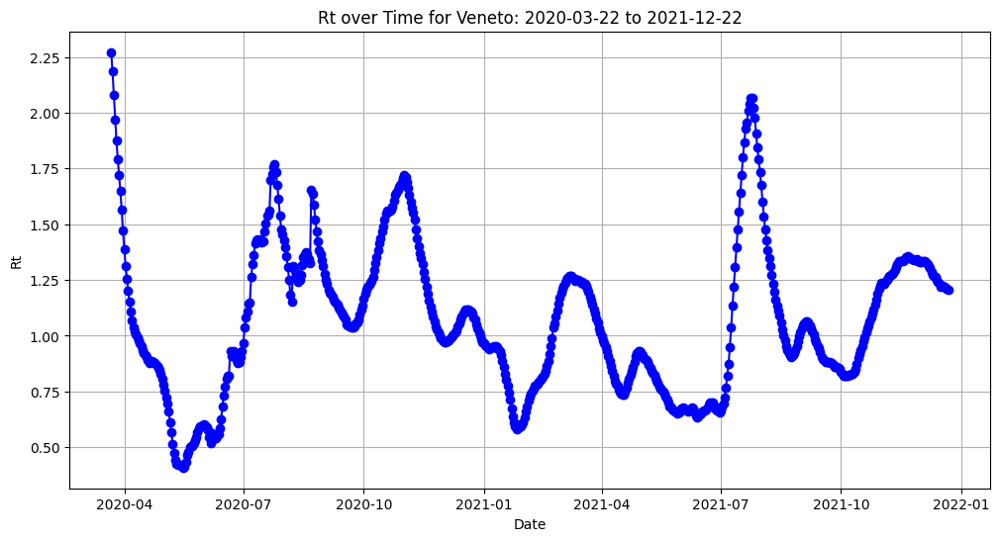

In [50]:
import matplotlib.pyplot as plt
start_date="2020-03-22"
end_date="2021-12-22"
# Assuming your 'merged_data' DataFrame has the columns you mentioned
# Assuming 'date' column is in datetime format
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Specify the sub-region
sub_region = 'Veneto'

# Subset your data based on the specified sub-region and date range
subset_data = merged_data[(merged_data['sub_region_1'] == sub_region) & 
                          (merged_data['date'] >= start_date) & (merged_data['date'] <= end_date)]

# Plot 'rt' over time for Veneto
plt.figure(figsize=(12, 6))
plt.plot(subset_data['date'], subset_data['rt'], marker='o', linestyle='-', color='b')
plt.title(f'Rt over Time for {sub_region}: {start_date} to {end_date}')
plt.xlabel('Date')
plt.ylabel('Rt')
plt.grid(True)
plt.show()


NameError: name 'region_name_mobi2' is not defined

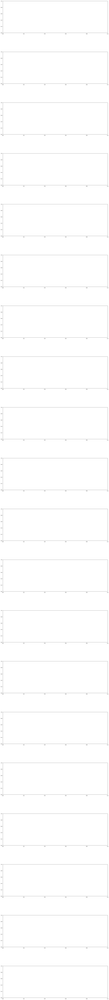

In [51]:

fig, axs = plt.subplots(20, 1, figsize=(20,190))  # Increase the height to 60
fig.subplots_adjust(hspace=0.6, wspace=0.3)
axs = axs.ravel()

# Initialize an empty list to store twinx axes
ax = []
df_mobility_ita = df_mobility_ita.dropna()

for b, i in enumerate(region_name_mobi2):
    reg_mob = result_df[result_df['sub_region_1'] == i]
    reg_mob = reg_mob[reg_mob['date'].between('2020-02-24', '2021-12-30')]

    reg_inc = df_Inc_ita[df_Inc_ita['subregion'] == i]
    reg_inc = reg_inc[reg_inc['date'].between('2020-02-24', '2021-12-30')]

    idx1 = pd.Index(reg_inc['date'])
    idx2 = pd.Index(reg_mob['date'])

    missing_dates = idx1.difference(idx2)
    for w in range(len(missing_dates)):
        reg_inc = reg_inc[reg_inc.date != missing_dates[w]]

    missing_dates2 = idx2.difference(idx1)
    for q in range(len(missing_dates2)):
        reg_mob = reg_mob[reg_mob.date != missing_dates2[q]]
    # Merge the two DataFrames on the 'date' column
    merged_df = pd.merge(reg_mob, reg_inc[['date', 'infected']], on='date', how='inner')

    y1 = merged_df['retail_and_recreation_percent_change_from_baseline']
    y2 = merged_df['parks_percent_change_from_baseline']
    y3 = merged_df['transit_stations_percent_change_from_baseline']
    y4 = merged_df['workplaces_percent_change_from_baseline']
    y5 = merged_df['residential_percent_change_from_baseline']
    y6 = merged_df['grocery_and_pharmacy_percent_change_from_baseline']
    x = merged_df['date']
    pr = merged_df['infected'] / 100

    # Append the twinx axis to the list
    ax.append(axs[b].twinx())

    axs[b].plot(x, y1, label='retail & recreation',linewidth=1)
    axs[b].plot(x, y2, label='Parks', linewidth=1)
    axs[b].plot(x, y3, label='Stations', linewidth=1)
    axs[b].plot(x, y4, label='Workplaces', linewidth=1)
    axs[b].plot(x, y5, label='Residential areas', linewidth=1)
    axs[b].plot(x, y6, label='Grocery and pharmacy', linewidth=1)

    axs[b].grid(True, which='both')
    axs[b].set_xlabel('Days', size=17)
    axs[b].set_ylabel('Mobility changes %', size=18)
    ax[b].set_ylabel('Prevalence', size=18)
    axs[b].set_xticks(axs[b].get_xticks()[::90])
    axs[b].tick_params(labelsize=15)
    axs[b].set_title(i, size=20)
    axs[b].axhline(y=0, color='k', label='Baseline')

    axs[b].tick_params(direction='in', bottom=True, top=True, left=True, right=True)
    axs[b].grid(linestyle='--', alpha=0.8, which='both')

    reg_startdate1 = '2020-03-10'
    reg_enddate1 = '2020-05-18'
    reg_startdate2 = '2020-05-18'
    reg_enddate2 = '2020-11-03'
    reg_startdate3 = '2020-12-21'
    reg_enddate3 = '2021-01-06'
    reg_startdate4 = '2021-05-06'
    reg_enddate4 = '2021-11-03'
    reg_startdate5 = '2021-11-03'
    reg_enddate5 = '2021-12-31'

    axs[b].text(x='2020-03-22', y=14, s="1st lockdown", color='black', size=15)
    axs[b].text(x='2020-07-08', y=14, s="Summer", color='black', size=15)
    axs[b].text(x='2020-11-06', y=14, s="2nd lockdown", color='black', size=15)
    axs[b].text(x='2021-02-06', y=14, s="winter", color='black', size=15)
    axs[b].text(x='2021-07-04', y=14, s="Summer", color='black', size=15)
    axs[b].text(x='2021-11-30', y=14, s="Winter", color='black', size=15)

    axs[b].axvline(x=reg_startdate1, color='black', linestyle='--')
    axs[b].axvline(x=reg_enddate1, color='black', linestyle='--')
    axs[b].axvline(x=reg_enddate2, color='black', linestyle='--')
    axs[b].axvline(x=reg_enddate3, color='black', linestyle='--')
    axs[b].axvline(x=reg_startdate4, color='black', linestyle='--')
    axs[b].axvline(x=reg_startdate5, color='black', linestyle='--')
    axs[b].axvline(x=reg_enddate5, color='black', linestyle='--')

    # Check if 'pr' is not empty before setting y-axis limits
    # if not pr.empty:
    #     ax[b].set_ylim([min(pr), max(pr)])

    # Plot the 'pr' line directly on the main plot
    ax[b].plot(x, pr, label='Prevalence', color="red", linestyle='--', marker='o', markersize=3)
    axs[b].legend(loc='best')
    ax[b].legend(loc='best')

# Save the figure
plt.savefig('1h.png')



In [ ]:
import pandas as pd
import statsmodels.api as sm

rt_data_cleaned_Sci = rt_data_cleaned[rt_data_cleaned["denominazione_regione"]=="Veneto"]
mobility_data = df_mobility_ita[df_mobility_ita["sub_region_1"] == "Veneto"]
merged_data2 = pd.merge(rt_data_cleaned_Sci, mobility_data, on='date', how='inner')
merged_data2 = merged_data2.dropna()


# Assuming your merged data is in a DataFrame named 'merged_data'


# Choose the mobility category and dependent variable
mobility_category = 'residential_percent_change_from_baseline'
dependent_variable = 'rt'  # You can switch to 'Rt'

# Select relevant data
data_subset1 = merged_data2[[mobility_category, dependent_variable]]
data_subset1.isnull().sum()
# Correlation analysis
correlation = data_subset1.corr(method='pearson')
print(f"Correlation between {mobility_category} and {dependent_variable}: {correlation.loc[mobility_category, dependent_variable]}")

# Linear regression
model = sm.OLS(data_subset1[dependent_variable], sm.add_constant(data_subset1[mobility_category]))
results = model.fit()
print(results.summary())

# Interpret the results (coefficients, p-values, R-squared)


KeyError: 'denominazione_regione'

In [ ]:
correlation, _ = pearsonr(merged_data['rt'], merged_data['parks'])
print(f"Pearson correlation between Rt and mobility: {correlation}")

correlation_lag7, _ = pearsonr(merged_data['rt'], merged_data['parks_lag7'])
print(f"Pearson correlation between Rt and mobility (lagged 7): {correlation_lag7}")

correlation_lag7, _ = pearsonr(merged_data['rt'], merged_data['parks_lag14'])
print(f"Pearson correlation between Rt and mobility (lagged 14): {correlation_lag7}")

correlation_lag7, _ = pearsonr(merged_data['rt'], merged_data['parks_lag21'])
print(f"Pearson correlation between Rt and mobility (lagged 21): {correlation_lag7}")

correlation_lag7, _ = pearsonr(merged_data['rt'], merged_data['parks_lag28'])
print(f"Pearson correlation between Rt and mobility (lagged 28): {correlation_lag7}")

Pearson correlation between Rt and mobility: 0.01354395150596617
Pearson correlation between Rt and mobility (lagged 7): 0.03478485764000827
Pearson correlation between Rt and mobility (lagged 14): 0.05987146672085226
Pearson correlation between Rt and mobility (lagged 21): 0.07197199998373036
Pearson correlation between Rt and mobility (lagged 28): 0.08610533506946322


In [ ]:
from scipy.stats import pearsonr

# Assuming your 'merged_data' DataFrame has a 'date' column
# Assuming you want to consider data from 'start_date' to 'end_date'
start_date = '2020-02-24'
end_date = '2021-05-18'

# Subset your data based on the specified date range
subset_data = merged_data[(merged_data['date'] >= start_date) & (merged_data['date'] <= end_date)]

# Calculate Pearson correlation for each lag
correlation, _ = pearsonr(subset_data['rt'], subset_data['parks'])
print(f"Pearson correlation between Rt and parks: {correlation}")

correlation_lag7, _ = pearsonr(subset_data['rt'], subset_data['parks_lag7'])
print(f"Pearson correlation between Rt and parks (lagged 7): {correlation_lag7}")

correlation_lag14, _ = pearsonr(subset_data['rt'], subset_data['parks_lag14'])
print(f"Pearson correlation between Rt and parks (lagged 14): {correlation_lag14}")

correlation_lag21, _ = pearsonr(subset_data['rt'], subset_data['parks_lag21'])
print(f"Pearson correlation between Rt and parks (lagged 21): {correlation_lag21}")

correlation_lag28, _ = pearsonr(subset_data['rt'], subset_data['parks_lag28'])
print(f"Pearson correlation between Rt and parks (lagged 28): {correlation_lag28}")


Pearson correlation between Rt and parks: 0.15951462793800325
Pearson correlation between Rt and parks (lagged 7): 0.21952524953620348
Pearson correlation between Rt and parks (lagged 14): 0.3070624493674418
Pearson correlation between Rt and parks (lagged 21): 0.38012223952327134
Pearson correlation between Rt and parks (lagged 28): 0.45169819842254005


In [ ]:
# Assuming your 'merged_data' DataFrame has the columns you mentioned
# Assuming 'date' column is in datetime format
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the time spans
time_spans = [
    ('2020-02-24', '2021-05-18'),
    ('2020-05-24', '2020-11-24'),
    ('2020-11-20', '2021-02-18'),
    ('2021-02-18', '2021-05-19'),
    ('2021-05-19', '2021-11-19'),
    ('2021-11-10', merged_data['date'].max())
]

# Loop through time spans
for start_date, end_date in time_spans:
    subset_data = merged_data[(merged_data['date'] >= start_date) & (merged_data['date'] <= end_date)]
    
    # Calculate Pearson correlation for each place
    for place in ['retail_and_recreation_lag7', 'grocery_and_pharmacy_lag7', 'parks_lag7', 'transit_stations_lag7', 'workplaces_lag7', 'residential_lag7']:
        correlation, _ = pearsonr(subset_data['rt'], subset_data[place])
        print(f"Time Span: {start_date} to {end_date}, Place: {place}, Pearson Correlation: {correlation:.2f}")


Time Span: 2020-02-24 to 2021-05-18, Place: retail_and_recreation_lag7, Pearson Correlation: 0.24
Time Span: 2020-02-24 to 2021-05-18, Place: grocery_and_pharmacy_lag7, Pearson Correlation: 0.14
Time Span: 2020-02-24 to 2021-05-18, Place: parks_lag7, Pearson Correlation: 0.22
Time Span: 2020-02-24 to 2021-05-18, Place: transit_stations_lag7, Pearson Correlation: 0.25
Time Span: 2020-02-24 to 2021-05-18, Place: workplaces_lag7, Pearson Correlation: 0.16
Time Span: 2020-02-24 to 2021-05-18, Place: residential_lag7, Pearson Correlation: -0.23
Time Span: 2020-05-24 to 2020-11-24, Place: retail_and_recreation_lag7, Pearson Correlation: 0.29
Time Span: 2020-05-24 to 2020-11-24, Place: grocery_and_pharmacy_lag7, Pearson Correlation: 0.38
Time Span: 2020-05-24 to 2020-11-24, Place: parks_lag7, Pearson Correlation: 0.13
Time Span: 2020-05-24 to 2020-11-24, Place: transit_stations_lag7, Pearson Correlation: 0.31
Time Span: 2020-05-24 to 2020-11-24, Place: workplaces_lag7, Pearson Correlation: 0.

In [ ]:
from scipy.stats import pearsonr

# Assuming your 'merged_data' DataFrame has the columns you mentioned
# Assuming 'date' column is in datetime format
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the time spans
time_spans = [
    ('2020-02-24', '2021-05-18'),
    ('2020-05-24', '2020-11-24'),
    ('2020-11-20', '2021-02-18'),
    ('2021-02-18', '2021-05-19'),
    ('2021-05-19', '2021-11-19'),
    ('2021-11-10', merged_data['date'].max())
]

# Define places with lag for correlation calculation
places_with_lag = ['retail_and_recreation_lag7', 'grocery_and_pharmacy_lag7', 'parks_lag7', 'transit_stations_lag7', 'workplaces_lag7', 'residential_lag7']

# Loop through time spans
for start_date, end_date in time_spans:
    print(f"Time Span: {start_date} to {end_date}")
    
    # Loop through sub-regions
    for sub_region in merged_data['sub_region_1'].unique():
        subset_data = merged_data[(merged_data['date'] >= start_date) & (merged_data['date'] <= end_date) & (merged_data['sub_region_1'] == sub_region)]
        
        # Calculate Pearson correlation for each place with lag
        for place in places_with_lag:
            correlation, _ = pearsonr(subset_data['rt'], subset_data[place])
            print(f"Sub-region: {sub_region}, Place: {place}, Pearson Correlation: {correlation:.2f}")


Time Span: 2020-02-24 to 2021-05-18
Sub-region: Abruzzo, Place: retail_and_recreation_lag7, Pearson Correlation: 0.31
Sub-region: Abruzzo, Place: grocery_and_pharmacy_lag7, Pearson Correlation: 0.16
Sub-region: Abruzzo, Place: parks_lag7, Pearson Correlation: 0.28
Sub-region: Abruzzo, Place: transit_stations_lag7, Pearson Correlation: 0.32
Sub-region: Abruzzo, Place: workplaces_lag7, Pearson Correlation: 0.23
Sub-region: Abruzzo, Place: residential_lag7, Pearson Correlation: -0.26
Sub-region: Basilicata, Place: retail_and_recreation_lag7, Pearson Correlation: 0.06
Sub-region: Basilicata, Place: grocery_and_pharmacy_lag7, Pearson Correlation: -0.01
Sub-region: Basilicata, Place: parks_lag7, Pearson Correlation: 0.01
Sub-region: Basilicata, Place: transit_stations_lag7, Pearson Correlation: 0.01
Sub-region: Basilicata, Place: workplaces_lag7, Pearson Correlation: 0.07
Sub-region: Basilicata, Place: residential_lag7, Pearson Correlation: -0.03
Sub-region: Calabria, Place: retail_and_recre

In [ ]:
import pandas as pd
from scipy.stats import pearsonr, spearmanr, kendalltau
from matplotlib import pyplot as plt  # For visualization

# Assuming your 'merged_data' DataFrame has the columns you mentioned
# Assuming 'date' column is in datetime format
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the time spans
time_spans = [
    ('2020-02-24', '2021-05-18'),
    ('2021-11-10', merged_data['date'].max())
]

# Define places and lags for correlation calculation
places = ['retail_and_recreation', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential']
lags = [7, 14]  # Adjust lags as needed

# Loop through time spans
for start_date, end_date in time_spans:
    print(f"Time Span: {start_date} to {end_date}")

    # Loop through sub-regions
    for sub_region in merged_data['sub_region_1'].unique():
        subset_data = merged_data[
            (merged_data['date'] >= start_date) &
            (merged_data['date'] <= end_date) &
            (merged_data['sub_region_1'] == sub_region)
        ]

        # Loop through places and lags
        for place in places:
            for lag in lags:
                lagged_column = f"{place}_lag{lag}"

                # Calculate multiple correlation coefficients
                correlation_pearson, _ = pearsonr(subset_data['rt'], subset_data[lagged_column])
                correlation_spearman, _ = spearmanr(subset_data['rt'], subset_data[lagged_column])
                correlation_kendall, _ = kendalltau(subset_data['rt'], subset_data[lagged_column])

                print(f"Sub-region: {sub_region}, Place: {place}, Lag: {lag}")
                print(f"  Pearson Correlation: {correlation_pearson:.2f}")
                print(f"  Spearman Correlation: {correlation_spearman:.2f}")
                print(f"  Kendall Correlation: {correlation_kendall:.2f}")

                # Optional: Visualize correlations (uncomment to visualize)
                # plt.scatter(subset_data['rt'], subset_data[lagged_column])
                # plt.xlabel('Rt')
                # plt.ylabel(f'{place} (Lag: {lag})')
                # plt.title(f'Correlation between Rt and {place} (Lag: {lag})')
                # plt.show()


Time Span: 2020-02-24 to 2021-05-18
Sub-region: Abruzzo, Place: retail_and_recreation, Lag: 7
  Pearson Correlation: 0.31
  Spearman Correlation: 0.45
  Kendall Correlation: 0.32
Sub-region: Abruzzo, Place: retail_and_recreation, Lag: 14
  Pearson Correlation: 0.46
  Spearman Correlation: 0.60
  Kendall Correlation: 0.42
Sub-region: Abruzzo, Place: grocery_and_pharmacy, Lag: 7
  Pearson Correlation: 0.16
  Spearman Correlation: 0.37
  Kendall Correlation: 0.28
Sub-region: Abruzzo, Place: grocery_and_pharmacy, Lag: 14
  Pearson Correlation: 0.35
  Spearman Correlation: 0.52
  Kendall Correlation: 0.37
Sub-region: Abruzzo, Place: parks, Lag: 7
  Pearson Correlation: 0.28
  Spearman Correlation: 0.39
  Kendall Correlation: 0.27
Sub-region: Abruzzo, Place: parks, Lag: 14
  Pearson Correlation: 0.33
  Spearman Correlation: 0.52
  Kendall Correlation: 0.36
Sub-region: Abruzzo, Place: transit_stations, Lag: 7
  Pearson Correlation: 0.32
  Spearman Correlation: 0.47
  Kendall Correlation: 0.33

Time Span: 2020-02-24 to 2021-05-18


IndexError: index 2 is out of bounds for axis 0 with size 2

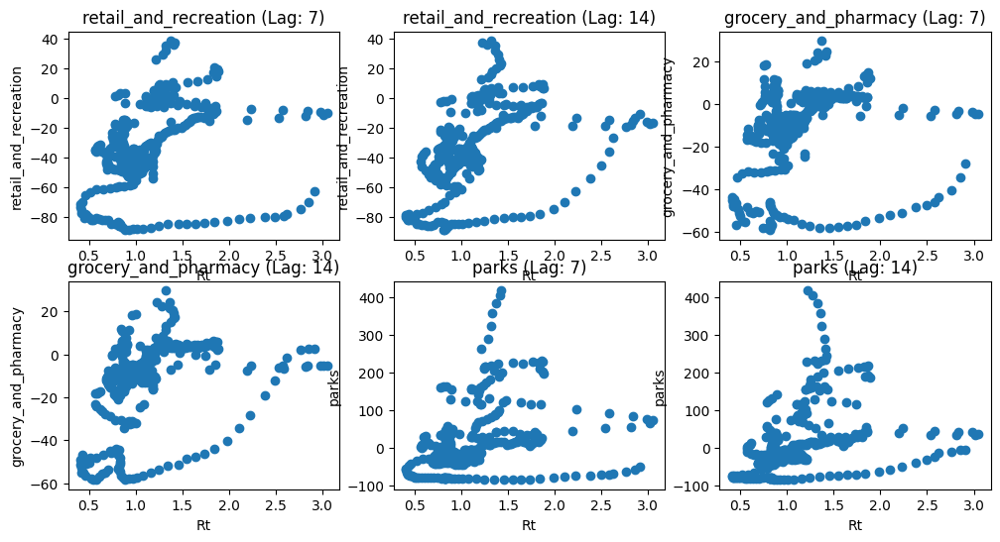

In [ ]:
import pandas as pd
from scipy.stats import pearsonr, spearmanr, kendalltau
import matplotlib.pyplot as plt

# Assuming your 'merged_data' DataFrame has the columns you mentioned
# Assuming 'date' column is in datetime format
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the time spans
time_spans = [
    ('2020-02-24', '2021-05-18'),
    ('2021-11-10', merged_data['date'].max())
]

# Define places and lags for correlation calculation
places = ['retail_and_recreation', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential']
lags = [7, 14]  # Adjust lags as needed

# Loop through time spans
for start_date, end_date in time_spans:
    print(f"Time Span: {start_date} to {end_date}")

    # Loop through sub-regions
    for sub_region in merged_data['sub_region_1'].unique():
        subset_data = merged_data[
            (merged_data['date'] >= start_date) &
            (merged_data['date'] <= end_date) &
            (merged_data['sub_region_1'] == sub_region)
        ]

        # Calculate correlations for all places and lags
        # (Store results in a dictionary for clarity and potential future use)
        correlations = {}
        for place in places:
            correlations[place] = {}  # Dictionary to store correlations for each place
            for lag in lags:
                lagged_column = f"{place}_lag{lag}"

                # Calculate multiple correlation coefficients
                correlation_pearson, _ = pearsonr(subset_data['rt'], subset_data[lagged_column])
                correlation_spearman, _ = spearmanr(subset_data['rt'], subset_data[lagged_column])
                correlation_kendall, _ = kendalltau(subset_data['rt'], subset_data[lagged_column])

                correlations[place][lag] = {
                    'pearson': correlation_pearson,
                    'spearman': correlation_spearman,
                    'kendall': correlation_kendall
                }

        # **Visualization using subplots (adjust figure size as needed):**
        fig, axes = plt.subplots(2, 3, figsize=(12, 6))

        # Loop through places and plot correlations on subplots
        row = 0
        col = 0
        for place, place_correlations in correlations.items():
            for lag, correlation_data in place_correlations.items():
                axes[row, col].scatter(subset_data['rt'], subset_data[f"{place}_lag{lag}"])
                axes[row, col].set_title(f"{place} (Lag: {lag})")
                axes[row, col].set_xlabel('Rt')
                axes[row, col].set_ylabel(f'{place}')
                col += 1
                if col == 3:
                    col = 0
                    row += 1

        # Adjust layout and display the figure
        fig.suptitle(f"Correlations in {sub_region}")
        plt.tight_layout()
        plt.show()

        # **Alternatively, explore other visualization libraries like seaborn for more options.**



In [ ]:
# import pandas as pd
# from scipy.stats import pearsonr
# import matplotlib.pyplot as plt

# # Assuming your 'merged_data' DataFrame has the columns you mentioned
# # Assuming 'date' column is in datetime format
# merged_data['date'] = pd.to_datetime(merged_data['date'])

# # Define the time spans
# time_spans = [
#     ('2020-02-24', '2021-05-18'),
#     ('2021-11-10', merged_data['date'].max())
# ]

# # Define places and lags for correlation calculation
# places = ['retail_and_recreation', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential']
# lags = [7, 14]  # Adjust lags as needed

# # Loop through time spans
# for start_date, end_date in time_spans:
#     print(f"Time Span: {start_date} to {end_date}")

#     # Loop through sub-regions
#     for sub_region in merged_data['sub_region_1'].unique():
#         subset_data = merged_data[
#             (merged_data['date'] >= start_date) &
#             (merged_data['date'] <= end_date) &
#             (merged_data['sub_region_1'] == sub_region)
#         ]

#         # Loop through places
#         for place in places:
#             # Calculate correlations for each lag
#             fig, ax = plt.subplots(figsize=(8, 6))
#             correlations = []
#             for lag in lags:
#                 lagged_column = f"{place}_lag{lag}"
#                 correlation_pearson, _ = pearsonr(subset_data['rt'], subset_data[lagged_column])
#                 correlations.append(correlation_pearson)

#             # Plot correlations vs lags
#             ax.plot(lags, correlations, marker='o', linestyle='-')
#             ax.set_xlabel('Lag (Days)')
#             ax.set_ylabel('Pearson Correlation')
#             ax.set_title(f"Correlation between Rt and {place} (Sub-region: {sub_region})")

#             plt.grid(True)
#             plt.tight_layout()
#             plt.show()


In [ ]:
# import pandas as pd
# from scipy.stats import pearsonr
# import matplotlib.pyplot as plt

# # Assuming your 'merged_data' DataFrame has the columns you mentioned
# # Assuming 'date' column is in datetime format
# merged_data['date'] = pd.to_datetime(merged_data['date'])

# # Define the time spans
# time_spans = [
#     ('2020-02-24', '2021-05-18'),
#     ('2021-11-10', merged_data['date'].max())
# ]

# # Define places and lags for correlation calculation
# places = ['retail_and_recreation', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential']
# lags = [7, 14]  # Adjust lags as needed

# # Loop through time spans
# for start_date, end_date in time_spans:
#     print(f"Time Span: {start_date} to {end_date}")

#     # Loop through sub-regions
#     for sub_region in merged_data['sub_region_1'].unique():
#         subset_data = merged_data[
#             (merged_data['date'] >= start_date) &
#             (merged_data['date'] <= end_date) &
#             (merged_data['sub_region_1'] == sub_region)
#         ]

#         # Calculate correlations for all places and lags (store in a dictionary)
#         correlations = {}
#         for place in places:
#             correlations[place] = {}  # Dictionary to store correlations for each place
#             for lag in lags:
#                 lagged_column = f"{place}_lag{lag}"

#                 # Calculate correlation coefficients
#                 correlation_pearson, _ = pearsonr(subset_data['rt'], subset_data[lagged_column])
#                 correlations[place][lag] = correlation_pearson

#         # Create a heatmap using pandas or seaborn
#         correlation_matrix = pd.DataFrame(correlations).transpose()
#         fig, ax = plt.subplots(figsize=(8, 6))

#         # Create the heatmap using pcolormesh (ensure correct arguments)
#         heatmap = ax.pcolormesh(correlation_matrix, vmin=-1, vmax=1, cmap='coolwarm')

#         # Add labels and title
#         ax.set_xticks(range(len(lags)))
#         ax.set_yticks(range(len(places)))
#         ax.set_xticklabels(lags, rotation=45, ha='right')
#         ax.set_yticklabels(places)
#         ax.set_title(f"Correlation Heatmap - {sub_region}")

#         # Create the colorbar using the heatmap object
#         plt.colorbar(heatmap, label='Pearson Correlation')
#         plt.tight_layout()
#         plt.show()


In [ ]:
import folium
import json

# Assuming you have a GeoJSON file named 'italy_subregions.geojson'
# and calculated correlations stored in a dictionary 'correlations_by_subregion' with average correlations

# Read GeoJSON data
with open('italy_subregions.geojson', 'r') as f:
    subregions_data = json.load(f)

# Create base map
m = folium.Map(location=[41.89, 12.57], zoom_start=5)  # Adjust location and zoom as needed

# Define color gradient based on correlation values (adjust ranges and colors as needed)
color_gradient = {
    value: f'#{255 - int(255 * (value + 1) / 2):02x}' for value in range(-100, 101)  # Example gradient from red to green
}

# Style sub-region polygons based on average correlation
folium.GeoJson(
    subregions_data,
    style_function=lambda feature: {
        'fillColor': color_gradient[correlations_by_subregion[feature['properties']['id']]],
        'fillOpacity': 0.7,
        'weight': 1
    }
).add_to(m)

# Add legend (adjust labels and colors based on your gradient)
folium.Legend(
    title='Average Correlation',
    labels=[f'Low ({-1}) - High ({1})'],
    colors=[color_gradient[-1], color_gradient[0]]  # Opposite ends of the gradient
).add_to(m)

m


FileNotFoundError: [Errno 2] No such file or directory: 'italy_subregions.geojson'

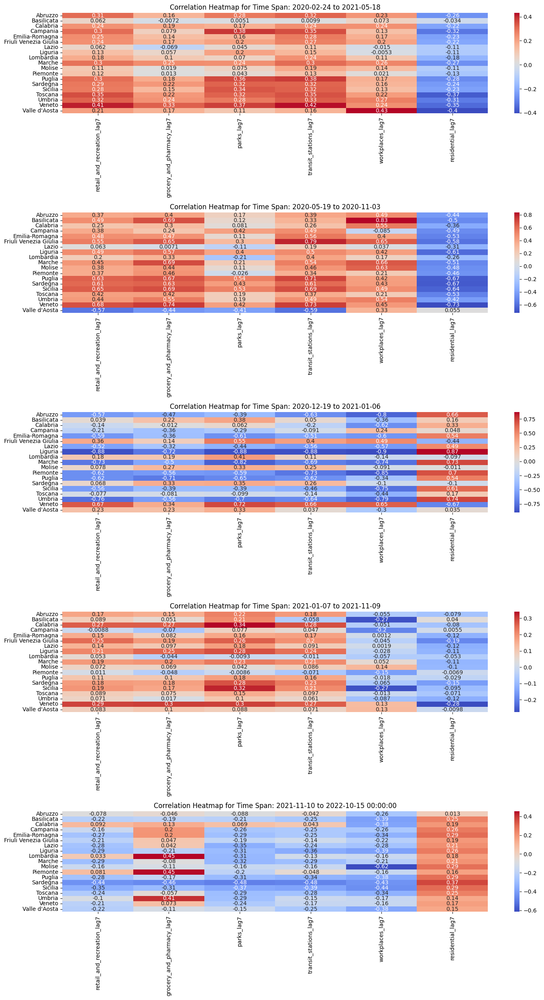

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your 'merged_data' DataFrame has the columns you mentioned
# Assuming 'date' column is in datetime format
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the time spans
time_spans = [
    ('2020-02-24', '2021-05-18'),
    ('2020-05-19', '2020-11-03'),
    ('2020-12-19', '2021-01-06'),
    ('2021-01-07', '2021-11-09'),
    ('2021-11-10', merged_data['date'].max())
]

# Define places with lag for correlation calculation
places_with_lag = ['retail_and_recreation_lag7', 'grocery_and_pharmacy_lag7', 'parks_lag7', 'transit_stations_lag7', 'workplaces_lag7', 'residential_lag7']

# Create a subplot grid
num_rows = len(time_spans)
num_cols = 1

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# Loop through time spans
for i, (start_date, end_date) in enumerate(time_spans):
    correlations = []
    sub_regions = []
    
    # Loop through sub-regions
    for sub_region in merged_data['sub_region_1'].unique():
        subset_data = merged_data[(merged_data['date'] >= start_date) & (merged_data['date'] <= end_date) & (merged_data['sub_region_1'] == sub_region)]
        
        # Calculate Pearson correlation for each place with lag
        sub_correlations = []
        for place in places_with_lag:
            correlation, _ = pearsonr(subset_data['rt'], subset_data[place])
            sub_correlations.append(correlation)
        
        correlations.append(sub_correlations)
        sub_regions.append(sub_region)
    
    # Create a heatmap for each time span
    sns.heatmap(correlations, annot=True, cmap='coolwarm', yticklabels=sub_regions, xticklabels=places_with_lag, ax=axes[i])
    axes[i].set_title(f'Correlation Heatmap for Time Span: {start_date} to {end_date}')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.svm import OneClassSVM
from sklearn.cluster import KMeans


# Feature scaling (assuming you want to scale features)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(merged_data[['retail_and_recreation', 'grocery_and_pharmacy',
       'parks', 'transit_stations', 'workplaces', 'residential']])  # Replace with your chosen features

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, merged_data['rt'], test_size=0.2, random_state=42)

# Predictive modeling (using Random Forest as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae}")

# Anomaly detection (example)
anomaly_detector = OneClassSVM(nu=0.1)  # Adjust nu parameter as needed
anomaly_detector.fit(X_scaled)

# Clustering (example)
kmeans = KMeans(n_clusters=3, random_state=42)  # Adjust k as needed
kmeans.fit(X_scaled)
merged_data['cluster'] = kmeans.predict(X_scaled)


Mean Absolute Error: 0.20203986876655183


c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py:110: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py", line 217, in _count_physical_cores
    raise ValueError(


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.svm import OneClassSVM
from sklearn.cluster import KMeans

# Feature scaling (assuming you want to scale features)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(merged_data[['retail_and_recreation', 'grocery_and_pharmacy',
                                             'parks', 'transit_stations', 'workplaces', 'residential']])

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, merged_data['rt'], test_size=0.2, random_state=42)

# Predictive modeling (using Random Forest as an example)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae}")

# Anomaly detection
anomaly_detector = OneClassSVM(nu=0.1)  # Adjust nu parameter as needed
anomaly_detector.fit(X_scaled)

# Apply anomaly detection to new data (example)
# Replace `new_data` with your actual data point (scaled)
new_data_scaled = scaler.transform([new_data])  # Scale new data point
anomaly_score = anomaly_detector.score_samples(new_data_scaled)[0]

if anomaly_score < 0:
    print("Anomaly detected!")
else:
    print("No anomaly detected.")

# Clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Adjust k as needed
kmeans.fit(X_scaled)
merged_data['cluster'] = kmeans.predict(X_scaled)

# Analyze clusters (optional)
# Explore characteristics of each cluster based on features and domain knowledge
print(merged_data.groupby('cluster').describe())


Mean Absolute Error: 0.20203986876655183


NameError: name 'new_data' is not defined

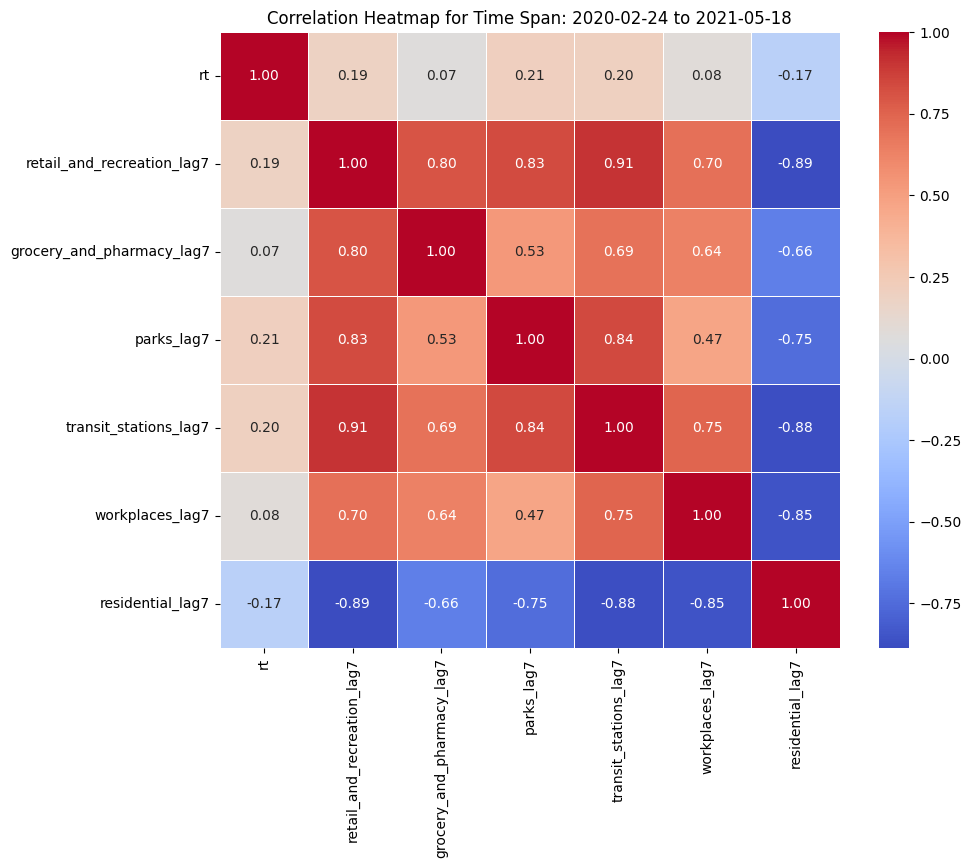

In [ ]:
import seaborn as sns

# Assuming your 'merged_data' DataFrame has the columns you mentioned
# Assuming 'date' column is in datetime format
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the time span
start_date = '2020-02-24'
end_date = '2021-05-18'

# Subset your data based on the specified date range
subset_data = merged_data[(merged_data['date'] >= start_date) & (merged_data['date'] <= end_date)]

# Extract relevant columns
places = ['retail_and_recreation_lag7', 'grocery_and_pharmacy_lag7', 'parks_lag7', 'transit_stations_lag7', 'workplaces_lag7', 'residential_lag7']
subset_data = subset_data[['rt'] + places]

# Calculate the correlation matrix
correlation_matrix = subset_data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title(f'Correlation Heatmap for Time Span: {start_date} to {end_date}')
plt.show()


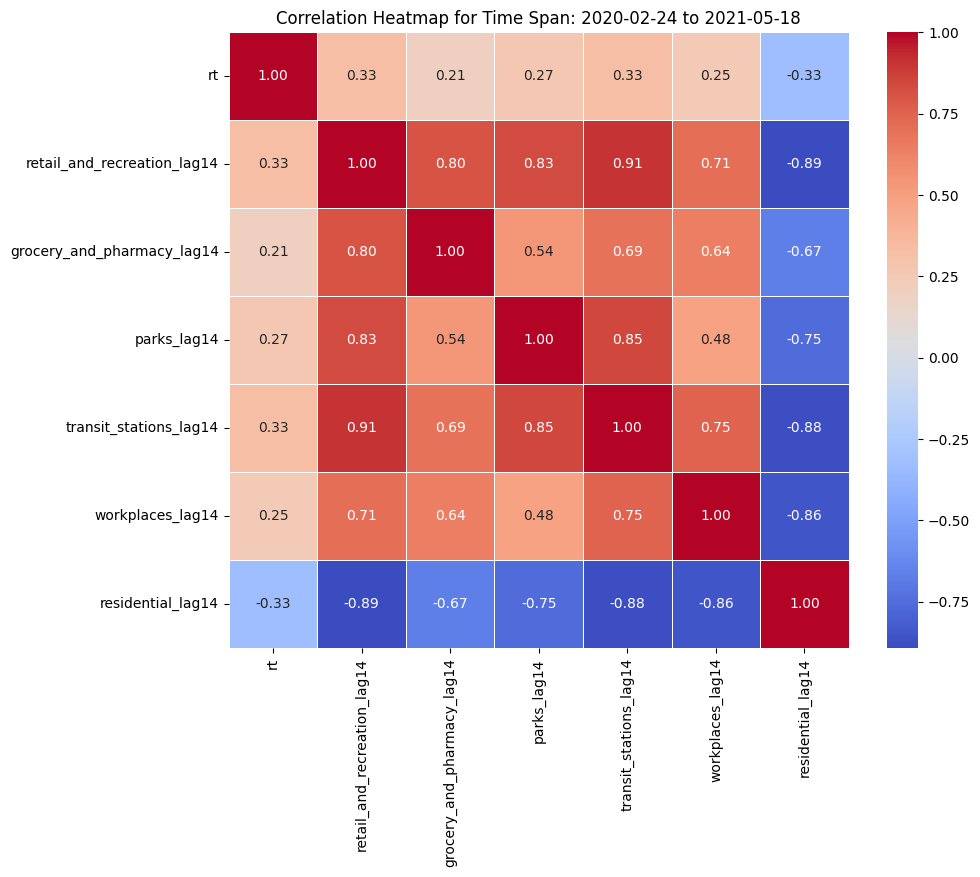

In [ ]:
import seaborn as sns

# Assuming your 'merged_data' DataFrame has the columns you mentioned
# Assuming 'date' column is in datetime format
merged_data['date'] = pd.to_datetime(merged_data['date'])

# Define the time span
start_date = '2020-02-24'
end_date = '2021-05-18'

# Subset your data based on the specified date range
subset_data = merged_data[(merged_data['date'] >= start_date) & (merged_data['date'] <= end_date)]

# Extract relevant columns
places = ['retail_and_recreation_lag14', 'grocery_and_pharmacy_lag14', 'parks_lag14', 'transit_stations_lag14', 'workplaces_lag14', 'residential_lag14']
subset_data = subset_data[['rt'] + places]

# Calculate the correlation matrix
correlation_matrix = subset_data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title(f'Correlation Heatmap for Time Span: {start_date} to {end_date}')
plt.show()


In [ ]:
kendall_corr = merged_data[['rt', 'transit_stations_lag28']].corr(method='kendall').iloc[0, 1]

# Display the Kendall correlation coefficient
print("Kendall correlation coefficient between 'rt' and 'another_column':", kendall_corr)

Kendall correlation coefficient between 'rt' and 'another_column': 0.16681794156830923


In [ ]:
merged_data_Ven = merged_data[merged_data['sub_region_1'] == 'Veneto']

merged_data_Ven['date'] = pd.to_datetime(merged_data_Ven['date'])

merged_data_Ven.set_index('date', inplace=True)

C:\Users\Shayan\AppData\Local\Temp\ipykernel_16276\1249697474.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_data_Ven['date'] = pd.to_datetime(merged_data_Ven['date'])


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the time interval for correlation calculation
interval_size = '20D'  # 20 days, you can adjust this based on your requirements

# Calculate correlations for each time interval for multiple columns
correlation_results['transit_stations'] = merged_data_Ven.resample(interval_size).apply(lambda x: x['rt'].corr(x['transit_stations']))

# Add correlations for other columns
correlation_results['transit_stations_lag7'] = merged_data_Ven.resample(interval_size).apply(lambda x: x['rt'].corr(x['transit_stations_lag7']))
# Add more correlations for other columns as needed

# Add correlations for other columns
correlation_results['transit_stations_lag14'] = merged_data_Ven.resample(interval_size).apply(lambda x: x['rt'].corr(x['transit_stations_lag14']))
# Add more correlations for other columns as needed

# Add correlations for other columns
correlation_results['transit_stations_lag28'] = merged_data_Ven.resample(interval_size).apply(lambda x: x['rt'].corr(x['transit_stations_lag28']))
# Add more correlations for other columns as needed

# Plot the results
plt.figure(figsize=(10, 5))
for column_name, column_data in correlation_results.iteritems():
    plt.plot(correlation_results.index, correlation_results[column], marker='o', linestyle='-', label=f'{column}')

plt.title(f'Correlation between Rt and Mobility over Time (Interval: {interval_size})')
plt.xlabel('Time')
plt.ylabel('Correlation')
plt.legend()
plt.grid(True)
plt.show()


NameError: name 'correlation_results' is not defined

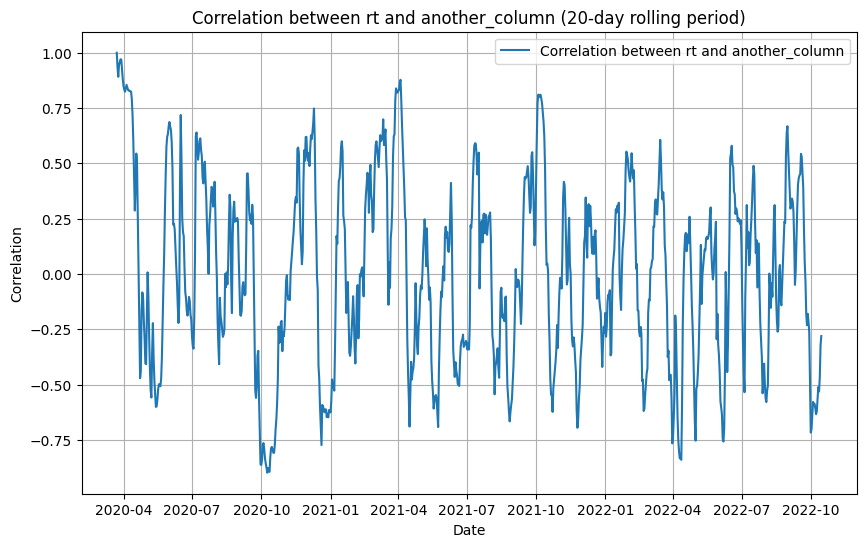

NameError: name 'correlation_results' is not defined

<Figure size 1000x500 with 0 Axes>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate the correlation between 'rt' and all other columns in 20-day rolling periods
rolling_corr = merged_data_Ven['rt'].rolling(window='20D').corr(merged_data_Ven['parks_lag14'])

# Plot the correlation
plt.figure(figsize=(10, 6))
plt.plot(rolling_corr.index, rolling_corr, label='Correlation between rt and another_column')
plt.title('Correlation between rt and another_column (20-day rolling period)')
plt.xlabel('Date')
plt.ylabel('Correlation')
plt.legend()
plt.grid(True)
plt.show()

# Plot the results
plt.figure(figsize=(10, 5))
correlation_results.plot(marker='o', linestyle='-')
plt.title(f'Correlation between Rt and Mobility over Time (Interval: {interval_size})')
plt.xlabel('Time')
plt.ylabel('Correlation')
plt.grid(True)
plt.show()


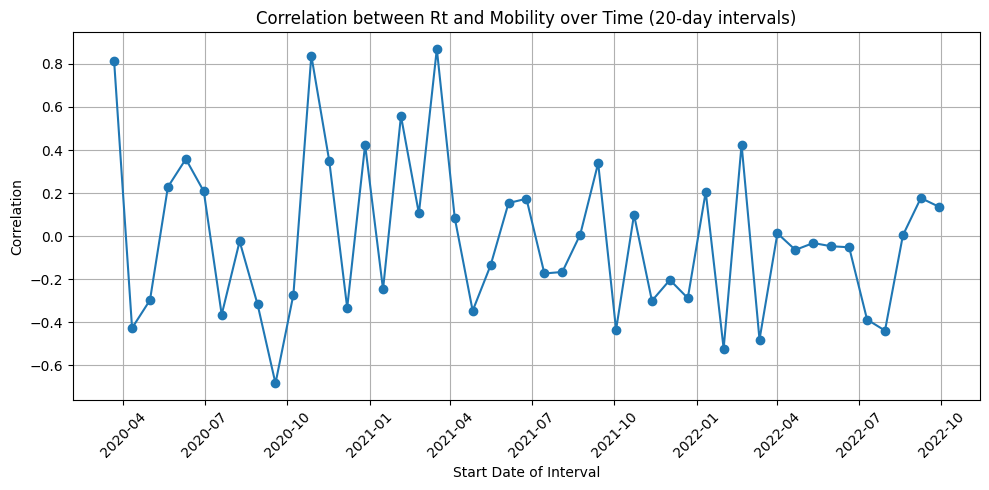

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


# Define the time interval for correlation calculation
interval_size = '20D'  # 20 days, you can adjust this based on your requirements

# Calculate correlations for each time interval
correlation_results = []
for start_date in merged_data_Ven.resample(interval_size).groups.keys():
    # Get data for the current 20-day interval
    interval_data = merged_data_Ven.loc[start_date:start_date + pd.Timedelta(days=19)]
    # Calculate correlation for the current interval
    correlation = interval_data['rt'].corr(interval_data['retail_and_recreation_lag14'])
    correlation_results.append((start_date, correlation))

# Convert correlation results to a DataFrame
correlation_results_df = pd.DataFrame(correlation_results, columns=['Start Date', 'Correlation'])

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(correlation_results_df['Start Date'], correlation_results_df['Correlation'], marker='o', linestyle='-')
plt.title('Correlation between Rt and Mobility over Time (20-day intervals)')
plt.xlabel('Start Date of Interval')
plt.ylabel('Correlation')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the time interval for correlation calculation
interval_size = '20D'  # 20 days, you can adjust this based on your requirements

# Calculate correlations for each time interval for multiple columns
correlation_results = pd.DataFrame()

# Add correlations for each column
columns_to_check = ['transit_stations', 'transit_stations_lag7', 'transit_stations_lag14', 'transit_stations_lag28']
for column in columns_to_check:
    correlation_results[column] = merged_data_Ven.resample(interval_size).apply(lambda x: x['rt'].corr(x[column]))

# Plot the results
plt.figure(figsize=(10, 5))
for column_name, column_data in correlation_results.iteritems():
    plt.plot(correlation_results.index, column_data, marker='o', linestyle='-', label=f'{column_name}')

plt.title(f'Correlation between Rt and Mobility over Time (Interval: {interval_size})')
plt.xlabel('Time')
plt.ylabel('Correlation')
plt.legend()
plt.grid(True)
plt.show()


AttributeError: 'DataFrame' object has no attribute 'iteritems'

<Figure size 1000x500 with 0 Axes>

In [ ]:


for name in names:
    merged_data[name] = normalized(merged_data[name])
    merged_data['rt'] = normalized(merged_data['rt'])
merged_data

,sub_region_1,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential,retail_and_recreation_lag7,parks_lag7,transit_stations_lag7,...,workplaces_lag21,residential_lag21,grocery_and_pharmacy_lag21,retail_and_recreation_lag28,parks_lag28,transit_stations_lag28,workplaces_lag28,residential_lag28,grocery_and_pharmacy_lag28,rt
date,,,,,,,,,,,,,,,,,,,,,
2020-03-22,Abruzzo,0.010645,0.041888,0.004492,0.007812,0.190068,0.642575,-90.500000,-80.000000,-86.250000,...,-2.250000,2.000000,-1.500000,0.750000,54.250000,11.250000,2.750000,-1.750000,8.750000,0.460342
2020-03-22,Basilicata,0.020963,0.029568,0.015873,0.024621,0.216895,0.605164,-86.666667,-71.666667,-76.333333,...,-0.333333,1.000000,-1.000000,9.666667,61.000000,31.666667,5.000000,-2.000000,4.000000,0.405992
2020-03-22,Calabria,0.008352,0.012509,0.004792,0.011364,0.172945,0.620992,-89.000000,-78.750000,-83.250000,...,-1.250000,0.750000,-4.500000,-2.500000,25.500000,0.750000,4.500000,0.000000,-1.500000,0.486210
2020-03-22,Campania,0.011792,0.059262,0.001897,0.014678,0.173516,0.633942,-91.333333,-86.333333,-84.333333,...,-0.833333,2.166667,-1.833333,-1.833333,30.000000,14.000000,3.833333,-1.500000,3.666667,0.388811
2020-03-22,Emilia-Romagna,0.002162,0.006444,0.001977,0.016477,0.187671,0.644302,-90.100000,-72.800000,-78.700000,...,-8.100000,6.600000,-8.400000,-8.900000,26.000000,-2.300000,-0.500000,0.700000,16.900000,0.380908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-15,Sicilia,0.437340,0.466262,0.203235,0.330966,0.598630,0.240257,-1.100000,93.000000,29.300000,...,-4.100000,0.600000,28.200000,5.600000,130.700000,36.600000,-5.000000,0.500000,27.000000,0.177808
2022-10-15,Toscana,0.447429,0.421394,0.191865,0.259814,0.585305,0.217967,1.545455,82.818182,1.000000,...,-7.000000,3.363636,13.909091,5.545455,86.727273,4.454545,-3.545455,-0.090909,18.090909,0.205837
2022-10-15,Umbria,0.458129,0.421279,0.241489,0.269886,0.563927,0.219536,1.666667,109.333333,3.666667,...,-12.333333,2.000000,12.666667,3.000000,91.333333,3.333333,-12.000000,0.666667,14.333333,0.199761


In [ ]:
def normalized(x, factor = 1, normalized = True):
    if normalized:
        return (x-min(x))/(max(x)-min(x))*factor
    else:
        return x

In [ ]:
merged_data = pd.merge(df_mobility_ita, rt_italy, on=['date', 'sub_region_1'], how='inner')

merged_data['date'] = pd.to_datetime(merged_data['date'])
merged_data.index = merged_data['date']
merged_data = merged_data.drop(columns = ['date'])


In [ ]:
merged_data_2021 = merged_data['2021']
merged_data_2021

C:\Users\Mohammad\AppData\Local\Temp\ipykernel_14596\1349021657.py:1: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  merged_data_2021 = merged_data['2021']


,sub_region_1,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential,rt
date,,,,,,,,
2021-01-01,Abruzzo,-84.0,-89.0,-49.0,-82.0,-83.0,29.0,0.811028
2021-01-01,Abruzzo,-84.0,-88.0,-43.0,-85.0,-82.0,29.0,0.811028
2021-01-01,Abruzzo,-86.0,-90.0,-66.0,-84.0,-80.0,29.0,0.811028
2021-01-01,Abruzzo,-84.0,-89.0,-59.0,-84.0,-84.0,29.0,0.811028
2021-01-01,Abruzzo,-83.0,-88.0,-14.0,-80.0,-85.0,32.0,0.811028
...,...,...,...,...,...,...,...,...
2021-12-31,Veneto,-26.0,42.0,11.0,-57.0,-67.0,18.0,1.251768
2021-12-31,Veneto,-20.0,39.0,33.0,-59.0,-58.0,16.0,1.251768
2021-12-31,Veneto,-20.0,46.0,42.0,-40.0,-66.0,19.0,1.251768


In [ ]:


region_names = mobility_italy['sub_region_1'].unique()

# categories name
names = ['retail_and_recreation',
        'grocery_and_pharmacy',
        'parks',
        'transit_stations',
        'workplaces',
        'residential']

# Dataframe dove storare i risultati
region_report = pd.DataFrame(region_names, columns = ['region_name'])
cut = False
for name in names:
    values = []
    shifts = []
    for r in region_names:
        df_region = merged_data_2021[merged_data_2021['sub_region_1'] == r]
        
        normalized_values = normalized(df_region[name])
        df_region.loc[:, name] = normalized_values
        
        normalized_values_rt = normalized(df_region['rt'])
        df_region.loc[:, 'rt'] = normalized_values_rt
        
        data_1 = df_region[name]
        data_2 = df_region['rt']
        rolling_median = data_1.rolling(window=7).median()
        rolling_std = data_1.rolling(window=7).std()
        to_drop = []
        for i in range(len(data_1)):
            if (data_1[i] > rolling_median[i] + 1*rolling_std[i]) | (data_1[i] < rolling_median[i] - 1*rolling_std[i]):
                to_drop.append(i)
        df_region = df_region.drop(df_region.index[to_drop])
        
        if cut:
            df_region_cutted = df_region[(df_region.index >= str(xdata[0])) & (df_region.index <= str(xdata[len(xdata)-1]))]
            data_1 = df_region_cutted[name]
        else:
            data_1 = df_region[name]
            
        correlations = []
        #for i in range(-30, 31):
        #    df_region_shift = df_region['rt'].shift(i)
        #    if cut:
        #        data_2 = df_region_shift[(df_region_shift.index >= str(xdata[0])) & (df_region_shift.index <= str(xdata[len(xdata)-1]))]
        #    else:
        #        data_2 = df_region_shift
        #    data_2 = data_2[~np.isnan(data_2)]
        #    if i < 0:
        #        data_1_cut = data_1[:len(data_2)]
        #    else:
        #        data_1_cut = data_1[len(data_1) - len(data_2):]
        #    correlations.append(stats.spearmanr(data_1_cut, data_2)[0])

        #mi = np.min(correlations)
        #ma = np.max(correlations)
        #if np.abs(mi) > ma:
        #    values.append(np.min(correlations))
        #    shifts.append(np.arange(-30,31)[np.argmin(correlations)])
        #else:
        #    values.append(np.max(correlations))
        #    shifts.append(np.arange(-30,31)[np.argmax(correlations)])
    #region_report[name] = values
    #region_report[name[:5] + 'shifts'] = shifts
    
        data_2 = df_region['rt'].shift(-7)
        data_2 = data_2[~np.isnan(data_2)]
        data_1_cut = data_1[:len(data_2)]
        correlations.append(stats.spearmanr(data_1_cut, data_2)[0])
        
    region_report[name] = correlation

C:\Users\Mohammad\AppData\Local\Temp\ipykernel_14596\1122479295.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_region.loc[:, name] = normalized_values
C:\Users\Mohammad\AppData\Local\Temp\ipykernel_14596\1122479295.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_region.loc[:, 'rt'] = normalized_values_rt
C:\Users\Mohammad\AppData\Local\Temp\ipykernel_14596\1122479295.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

In [ ]:
region_report

,region_name,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,Abruzzo,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
1,Basilicata,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
2,Calabria,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
3,Campania,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
4,Emilia-Romagna,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
5,Friuli Venezia Giulia,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
6,Lazio,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
7,Liguria,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
8,Lombardia,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
9,Marche,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901,-0.005901
